# Setup

In [ ]:
from google.colab import drive
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
def calculate_daily_long_trade_return_percentage(predicted_prices, true_prices):
  def generate_daily_trade_signals_long_only(predicted_prices, true_prices):
    signals = torch.zeros_like(predicted_prices)
    signals[:-1] = torch.where(predicted_prices[1:] > predicted_prices[:-1], 1, 0)  # Buy if tomorrow's predicted price > today's
    return signals

  signals = generate_daily_trade_signals_long_only(predicted_prices, true_prices)

  # Calculate price differences and percentage change
  price_diff = true_prices[1:] - true_prices[:-1]
  percentage_returns = (price_diff / true_prices[:-1])  # Convert to percentage change
  # Calculate returns based on signals
  returns = signals[:-1] * percentage_returns

  # Step 1: Calculate cumulative returns
  cumulative_returns = torch.cumprod(1 + returns, dim=0)

  # Step 2: Calculate running maximum of cumulative returns
  running_max, _ = torch.cummax(cumulative_returns, dim=0)

  # Step 3: Calculate drawdowns
  drawdowns = (cumulative_returns - running_max) / running_max

  # Step 4: Find the maximum drawdown
  max_drawdown = drawdowns.min()

  print("Return:", cumulative_returns[-1].item() - 1)
  print("Max Drawdown:", max_drawdown.item())
  return cumulative_returns[-1].item() - 1, max_drawdown.item()

In [ ]:
def calculate_daily_short_trade_return_percentage(predicted_prices, true_prices):
  def generate_daily_trade_signals_short_only(predicted_prices, true_prices):
    signals = torch.zeros_like(predicted_prices)
    # Generate a short signal (-1) if tomorrow's predicted price is lower than today's predicted price
    signals[:-1] = torch.where(predicted_prices[1:] < predicted_prices[:-1], 1, 0)
    return signals

  signals = generate_daily_trade_signals_short_only(predicted_prices, true_prices)

  # Calculate price differences and percentage change
  price_diff = true_prices[:-1] - true_prices[1:]  # Since this is a short trade, we reverse the diff
  percentage_returns = (price_diff / true_prices[:-1])  # Convert to percentage change
  # Calculate returns based on signals
  returns = signals[:-1] * percentage_returns
  # Step 1: Calculate cumulative returns
  cumulative_returns = torch.cumprod(1 + returns, dim=0)

  # Step 2: Calculate running maximum of cumulative returns
  running_max, _ = torch.cummax(cumulative_returns, dim=0)

  # Step 3: Calculate drawdowns
  drawdowns = (cumulative_returns - running_max) / running_max

  # Step 4: Find the maximum drawdown
  max_drawdown = drawdowns.min()

  print("Return:", cumulative_returns[-1].item() - 1)
  print("Max Drawdown:", max_drawdown.item())

# Data Pipeline


In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:

file_path = "/content/drive/MyDrive/24fall_dlProject/data/BTC-USD_stock_data.csv"

data = pd.read_csv(file_path,index_col='Date',parse_dates=['Date'])

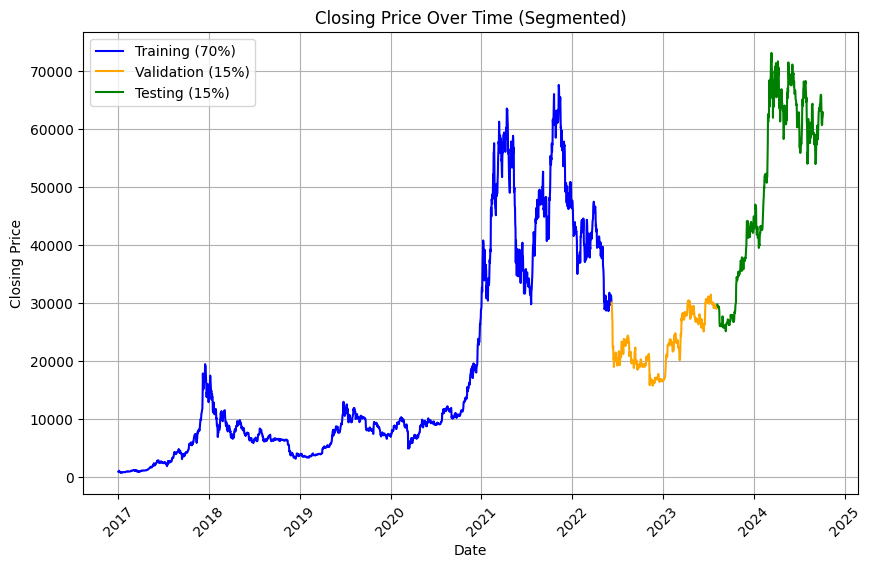

In [ ]:
close_data = data['Close'].values  # Get 'Close' data as a NumPy array
total_data_points = len(close_data)
segment1_end = int(total_data_points * 0.7)
segment2_end = int(total_data_points * (0.7 + 0.15))

plt.figure(figsize=(10, 6))

# Plotting segments with different colors
plt.plot(data.index[:segment1_end], close_data[:segment1_end], label='Training (70%)', color='blue')
plt.plot(data.index[segment1_end:segment2_end], close_data[segment1_end:segment2_end], label='Validation (15%)', color='orange')
plt.plot(data.index[segment2_end:], close_data[segment2_end:], label='Testing (15%)', color='green')

plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.title('Closing Price Over Time (Segmented)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.show()

In [ ]:
def data_preprocessing_with_closed_price_and_min_max_scaler(data, seq_length=60):
    train_ratio = 0.7
    val_ratio = 0.15
    close_data = data["Close"].values.reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(0, 10))
    data_scaled = scaler.fit_transform(close_data)
    data_scaled = pd.DataFrame(data_scaled, columns=["Close"])

    def create_feature_datasets(data, x_size):
        x_datasets = []
        y_datasets = []
        for i in range(len(data) - x_size):
            x = data[i:i + x_size].values.reshape(-1, 1)
            y = data[i + x_size:i + x_size + 1].values.reshape(1)
            x_datasets.append(x)
            y_datasets.append(y)
        X = np.array(x_datasets)
        y = np.array(y_datasets)
        X_train =  X[:int(len(X) * train_ratio)]
        y_train = y[:int(len(y) * train_ratio)]
        X_val = X[int(len(X) * train_ratio):int(len(X) * (train_ratio + val_ratio))]
        y_val = y[int(len(y) * train_ratio):int(len(y) * (train_ratio + val_ratio))]
        X_test = X[int(len(X) * (train_ratio + val_ratio)):]
        y_test = y[int(len(y) * (train_ratio + val_ratio)):]

        indices = np.arange(X_train.shape[0])
        np.random.shuffle(indices)
        X_train_shuffled = X_train[indices]
        y_train_shuffled = y_train[indices]

        return torch.Tensor(X_train_shuffled).to(device), torch.Tensor(X_val).to(device), torch.Tensor(X_test).to(device), torch.Tensor(y_train_shuffled).to(device), torch.Tensor(y_val).to(device), torch.Tensor(y_test).to(device)

    return create_feature_datasets(data_scaled, seq_length), scaler

(X_train, X_val, X_test, y_train, y_val, y_test), min_max_scaler = data_preprocessing_with_closed_price_and_min_max_scaler(data, 60)

# Baseline Model

In [ ]:
class TransformerModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout):
        super(TransformerModel, self).__init__()
        self.hidden_size = hidden_size

        # Input embedding to project input_size to hidden_size
        self.input_proj = nn.Linear(input_size, hidden_size)

        # Positional encoding for sequence information
        self.positional_encoding = PositionalEncoding(hidden_size, dropout)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(d_model=hidden_size, nhead=8, dim_feedforward=hidden_size*4, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Fully connected output layer
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x shape: (batch_size, seq_length, input_size)

        # Project input to the hidden_size
        x = self.input_proj(x)

        # Apply positional encoding
        x = self.positional_encoding(x)

        # Transformer expects input in (seq_length, batch_size, hidden_size) format
        x = x.permute(1, 0, 2)  # Change to (seq_length, batch_size, hidden_size)

        # Transformer Encoder
        x = self.transformer_encoder(x)

        # Get the output from the last time step
        x = x[-1, :, :]  # Last time step, shape: (batch_size, hidden_size)

        # Fully connected layer
        x = self.fc(x)
        return x


class PositionalEncoding(nn.Module):
    def __init__(self, hidden_size, dropout=0.1, max_len=100):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Create positional encoding matrix
        pe = torch.zeros(max_len, hidden_size)
        position = torch.arange(0, max_len).unsqueeze(1).float()
        div_term = torch.exp(torch.arange(0, hidden_size, 2).float() * (-torch.log(torch.tensor(10000.0)) / hidden_size))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)  # Add batch dimension
        self.register_buffer('pe', pe)

    def forward(self, x):
        # Add positional encoding to the input
        x = x + self.pe[:, :x.size(1), :]
        return self.dropout(x)

# Training

In [ ]:
# create a nn class (just-for-fun choice :-)
class RMSELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()

    def forward(self,yhat,y):
        return torch.sqrt(self.mse(yhat,y))

In [ ]:
# Hyperparameters
input_size = 5
hidden_size = 128
num_layers = 4
dropout = 0.2
output_size = 1
learning_rate = 0.0003
num_epochs = 200
batch_size = 64

# Create dataset and DataLoader for batching
dataset = TensorDataset(X_train, y_train)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Model, loss, optimizer
model = TransformerModel(input_size, hidden_size, num_layers, output_size, dropout)
model.to(device)
criterion = RMSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

epoch_losses = []

# Training loop with batching
for epoch in range(num_epochs):
    model.train()
    for batch_idx, (batch_x, batch_y) in enumerate(dataloader):
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()

    epoch_losses.append(loss.item())
    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


# Visualization

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.legend()
plt.grid()
plt.show()

In [ ]:
model.eval()
with torch.no_grad():
    predictions = model(X_train)
    print(f'Predicted value for the first sample: {predictions[0].item():.4f}')
rmse = torch.sqrt(torch.mean((predictions - y_train) ** 2))
print(f"Training Loss Scaling Unreversed: {rmse.item()}")

if device == torch.device("cuda"):
    predictions_cpu = predictions.cpu()
    y_train_cpu = y_train.cpu()

# Reverse the scaling
predictions_reversed = torch.Tensor(min_max_scaler.inverse_transform(predictions_cpu.numpy()))
y_train_reversed = torch.Tensor(min_max_scaler.inverse_transform(y_train_cpu.numpy()))
rmse_reversed = torch.sqrt(torch.mean((predictions_reversed - y_train_reversed) ** 2))
print(f"Training Loss Scaling Reversed: {rmse_reversed.item()}")

In [ ]:

# Convert tensors to 1D for plotting
tensor1 = predictions_reversed.view(-1)
tensor2 = y_train_reversed.view(-1)

# Plotting the line chart
plt.figure(figsize=(8, 5))
plt.scatter(tensor1.numpy(), tensor2.numpy(), label='Predictions vs GT', marker='o', s=10)

min_val = min(tensor1.min(), tensor2.min())
max_val = max(tensor1.max(), tensor2.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='-', label='Predictions = GT')

plt.title('Predictions vs GT on Training Set')
plt.xlabel('Predictions')
plt.ylabel('GT')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Convert tensors to 1D for plotting
tensor1 = predictions_reversed.view(-1)
tensor2 = y_train_reversed.view(-1)

# Plotting the line chart
plt.figure(figsize=(8, 5))
plt.plot(tensor1.numpy() - tensor2.numpy(), label='Predictions - GT', marker='o')
plt.title('Differences between Predictions and GT on Training Set')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
model.eval()
with torch.no_grad():
    predictions = model(X_val)
    print(f'Predicted value for the first sample: {predictions[0].item():.4f}')
rmse = torch.sqrt(torch.mean((predictions - y_val) ** 2))
print(f"Validation Loss Scaling Unreversed: {rmse.item()}")

if device == torch.device("cuda"):
    predictions_cpu = predictions.cpu()
    y_val_cpu = y_val.cpu()

# Reverse the scaling
predictions_reversed = torch.Tensor(min_max_scaler.inverse_transform(predictions_cpu.numpy()))
y_val_reversed = torch.Tensor(min_max_scaler.inverse_transform(y_val_cpu.numpy()))
rmse_reversed = torch.sqrt(torch.mean((predictions_reversed - y_val_reversed) ** 2))
print(f"Validation Loss Scaling Reversed: {rmse_reversed.item()}")

In [ ]:
# Convert tensors to 1D for plotting
tensor1 = predictions_reversed.view(-1)
tensor2 = y_val_reversed.view(-1)

# Plotting the line chart
plt.figure(figsize=(8, 5))
plt.plot(tensor1.numpy(), label='Predictions', marker='x')
plt.plot(tensor2.numpy(), label='GT', marker='.')
plt.title('Predictions vs GT on Validation Set')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Convert tensors to 1D for plotting
tensor1 = predictions_reversed.view(-1)
tensor2 = y_val_reversed.view(-1)

# Plotting the line chart
plt.figure(figsize=(8, 5))
plt.plot(tensor1.numpy() - tensor2.numpy(), label='Predictions - GT', marker='o')
plt.title('Differences between Predictions and GT on Validation Set')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

# Return

In [ ]:
# Example usage:
predicted_prices = predictions_reversed.view(-1)
true_prices = y_val_reversed.view(-1)

calculate_daily_long_trade_return_percentage(predicted_prices, true_prices)

In [ ]:
# Example usage:
predicted_prices = predictions_reversed.view(-1)
true_prices = y_val_reversed.view(-1)

calculate_daily_short_trade_return_percentage(predicted_prices, true_prices)

# Tuning

In [ ]:
def train_model(batch_size, hidden_size, num_layers, dropout, learning_rate, input_size=1, output_size=1, num_epochs=200):
  dataset = TensorDataset(X_train, y_train)
  dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

  # Model, loss, optimizer
  model = TransformerModel(input_size, hidden_size, num_layers, output_size, dropout)
  model = model.to(device)
  criterion = RMSELoss()
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)

  epoch_losses = []

  # Training loop with batching
  for epoch in range(num_epochs):
      model.train()
      for batch_idx, (batch_x, batch_y) in enumerate(dataloader):
          optimizer.zero_grad()
          outputs = model(batch_x)
          loss = criterion(outputs, batch_y)
          loss.backward()
          optimizer.step()

      epoch_losses.append(loss.item())
      if (epoch + 1) % 5 == 0:
          print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

  # Visualization
  plt.figure(figsize=(8, 6))
  plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', label='Training Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.title('Loss Curve')
  plt.legend()
  plt.grid()
  plt.show()

  model.eval()
  with torch.no_grad():
      predictions = model(X_train)
      print(f'Predicted value for the first sample: {predictions[0].item():.4f}')
  rmse = torch.sqrt(torch.mean((predictions - y_train) ** 2))
  print(f"Training Loss Scaling Unreversed: {rmse.item()}")

  if device == torch.device("cuda"):
      predictions_cpu = predictions.cpu()
      y_train_cpu = y_train.cpu()

  # Reverse the scaling
  predictions_reversed = torch.Tensor(min_max_scaler.inverse_transform(predictions_cpu.numpy()))
  y_train_reversed = torch.Tensor(min_max_scaler.inverse_transform(y_train_cpu.numpy()))
  rmse_reversed = torch.sqrt(torch.mean((predictions_reversed - y_train_reversed) ** 2))
  print(f"Training Loss Scaling Reversed: {rmse_reversed.item()}")

  # Convert tensors to 1D for plotting
  tensor1 = predictions_reversed.view(-1)
  tensor2 = y_train_reversed.view(-1)

  # Plotting the line chart
  plt.figure(figsize=(8, 5))
  plt.plot(tensor1.numpy() - tensor2.numpy(), label='Predictions - GT', marker='o')
  plt.title('Differences between Predictions and GT on Training Set')
  plt.xlabel('Index')
  plt.ylabel('Value')
  plt.legend()
  plt.grid(True)
  plt.show()

  model.eval()
  with torch.no_grad():
      predictions = model(X_val)
      print(f'Predicted value for the first sample: {predictions[0].item():.4f}')
  rmse_val = torch.sqrt(torch.mean((predictions - y_val) ** 2))
  print(f"Validation Loss Scaling Unreversed: {rmse_val.item()}")

  if device == torch.device("cuda"):
      predictions_cpu = predictions.cpu()
      y_val_cpu = y_val.cpu()

  # Reverse the scaling
  predictions_reversed = torch.Tensor(min_max_scaler.inverse_transform(predictions_cpu.numpy()))
  y_val_reversed = torch.Tensor(min_max_scaler.inverse_transform(y_val_cpu.numpy()))
  rmse_reversed_val = torch.sqrt(torch.mean((predictions_reversed - y_val_reversed) ** 2))
  print(f"Validation Loss Scaling Reversed: {rmse_reversed_val.item()}")

  # Convert tensors to 1D for plotting
  tensor1 = predictions_reversed.view(-1)
  tensor2 = y_val_reversed.view(-1)

  # Plotting the line chart
  plt.figure(figsize=(8, 5))
  plt.plot(tensor1.numpy(), label='Predictions', marker='x')
  plt.plot(tensor2.numpy(), label='GT', marker='.')
  plt.title('Predictions vs GT on Validation Set')
  plt.xlabel('Index')
  plt.ylabel('Value')
  plt.legend()
  plt.grid(True)
  plt.show()

  # Convert tensors to 1D for plotting
  tensor1 = predictions_reversed.view(-1)
  tensor2 = y_val_reversed.view(-1)

  # Plotting the line chart
  plt.figure(figsize=(8, 5))
  plt.plot(tensor1.numpy() - tensor2.numpy(), label='Predictions - GT', marker='o')
  plt.title('Differences between Predictions and GT on Validation Set')
  plt.xlabel('Index')
  plt.ylabel('Value')
  plt.legend()
  plt.grid(True)
  plt.show()

  # Example usage:
  predicted_prices = predictions_reversed.view(-1)
  true_prices = y_val_reversed.view(-1)

  r, m = calculate_daily_long_trade_return_percentage(predicted_prices, true_prices)

  return rmse_val, rmse_reversed_val, rmse, rmse_reversed, r, m

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 3.6735
Epoch [10/200], Loss: 2.0807
Epoch [15/200], Loss: 0.7073
Epoch [20/200], Loss: 0.7625
Epoch [25/200], Loss: 3.1710
Epoch [30/200], Loss: 0.4731
Epoch [35/200], Loss: 2.5738
Epoch [40/200], Loss: 1.3537
Epoch [45/200], Loss: 3.3094
Epoch [50/200], Loss: 2.2710
Epoch [55/200], Loss: 0.8725
Epoch [60/200], Loss: 1.3374
Epoch [65/200], Loss: 3.5110
Epoch [70/200], Loss: 0.9538
Epoch [75/200], Loss: 2.7714
Epoch [80/200], Loss: 1.0568
Epoch [85/200], Loss: 1.5028
Epoch [90/200], Loss: 2.3237
Epoch [95/200], Loss: 1.8626
Epoch [100/200], Loss: 2.0062
Epoch [105/200], Loss: 2.4926
Epoch [110/200], Loss: 0.7188
Epoch [115/200], Loss: 2.9587
Epoch [120/200], Loss: 2.8782
Epoch [125/200], Loss: 3.5626
Epoch [130/200], Loss: 2.6276
Epoch [135/200], Loss: 3.6128
Epoch [140/200], Loss: 1.0474
Epoch [145/200], Loss: 1.6029
Epoch [150/200], Loss: 0.8434
Epoch [155/200], Loss: 1.9637
Epoch [160/200], Loss: 1.9389
Epoch [165/200], Loss: 2.3897
Epoch [170/200], Loss: 0.8885


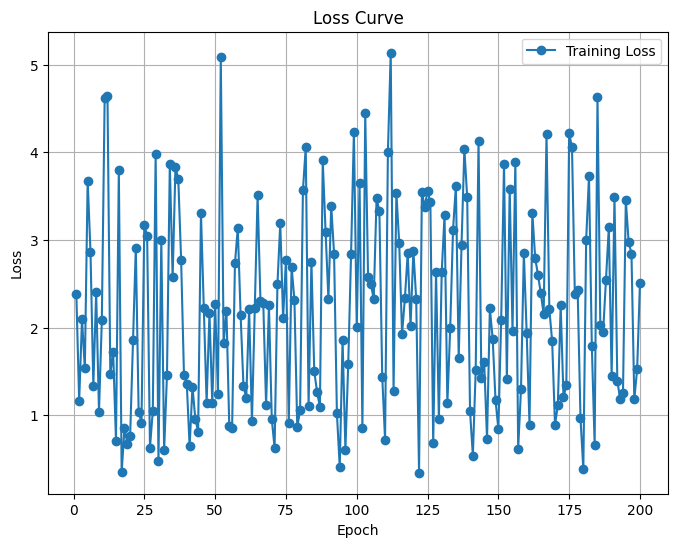

Predicted value for the first sample: 2.0590
Training Loss Scaling Unreversed: 2.440687894821167
Training Loss Scaling Reversed: 17647.57421875


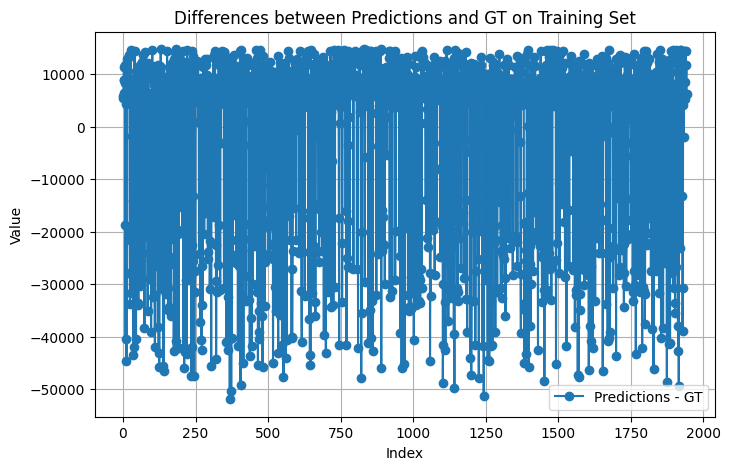

Predicted value for the first sample: 2.0590
Validation Loss Scaling Unreversed: 1.2322931289672852
Validation Loss Scaling Reversed: 8910.1875


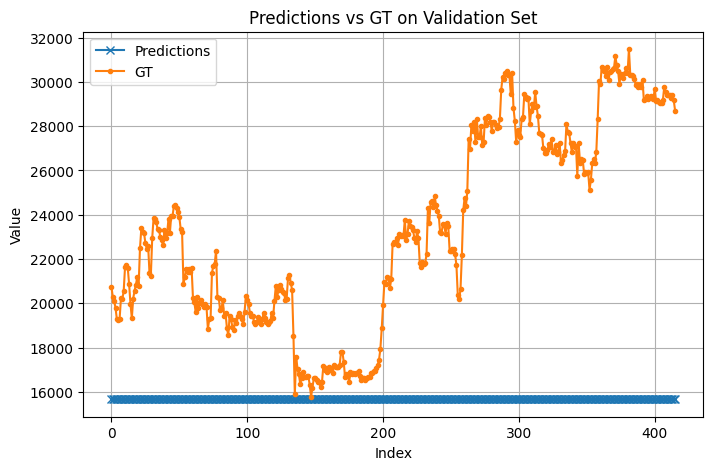

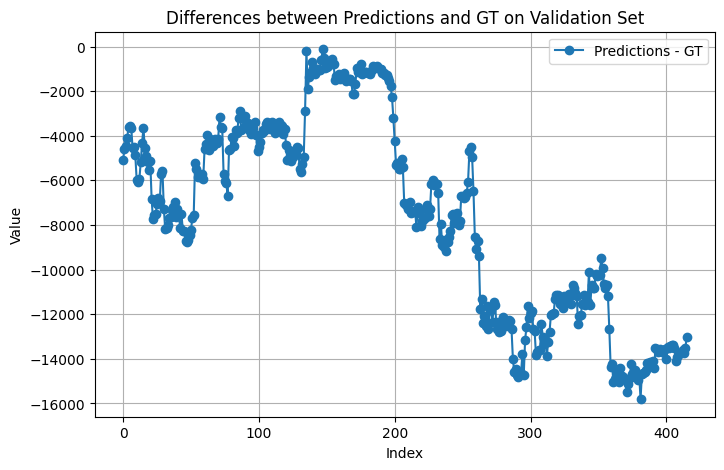

Return: 0.22131586074829102
Max Drawdown: -0.18901562690734863


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.2406
Epoch [10/200], Loss: 0.2370
Epoch [15/200], Loss: 0.1306
Epoch [20/200], Loss: 0.1941
Epoch [25/200], Loss: 0.1382
Epoch [30/200], Loss: 0.2479
Epoch [35/200], Loss: 0.5271
Epoch [40/200], Loss: 0.1673
Epoch [45/200], Loss: 0.0664
Epoch [50/200], Loss: 0.3847
Epoch [55/200], Loss: 0.1833
Epoch [60/200], Loss: 0.1075
Epoch [65/200], Loss: 0.0727
Epoch [70/200], Loss: 0.0760
Epoch [75/200], Loss: 0.2978
Epoch [80/200], Loss: 0.0641
Epoch [85/200], Loss: 0.4147
Epoch [90/200], Loss: 0.0626
Epoch [95/200], Loss: 0.1278
Epoch [100/200], Loss: 0.0885
Epoch [105/200], Loss: 0.0798
Epoch [110/200], Loss: 0.1773
Epoch [115/200], Loss: 0.3903
Epoch [120/200], Loss: 0.0998
Epoch [125/200], Loss: 0.0855
Epoch [130/200], Loss: 0.2245
Epoch [135/200], Loss: 0.0487
Epoch [140/200], Loss: 0.0759
Epoch [145/200], Loss: 0.1411
Epoch [150/200], Loss: 0.1164
Epoch [155/200], Loss: 0.3578
Epoch [160/200], Loss: 0.3515
Epoch [165/200], Loss: 0.3362
Epoch [170/200], Loss: 0.2281


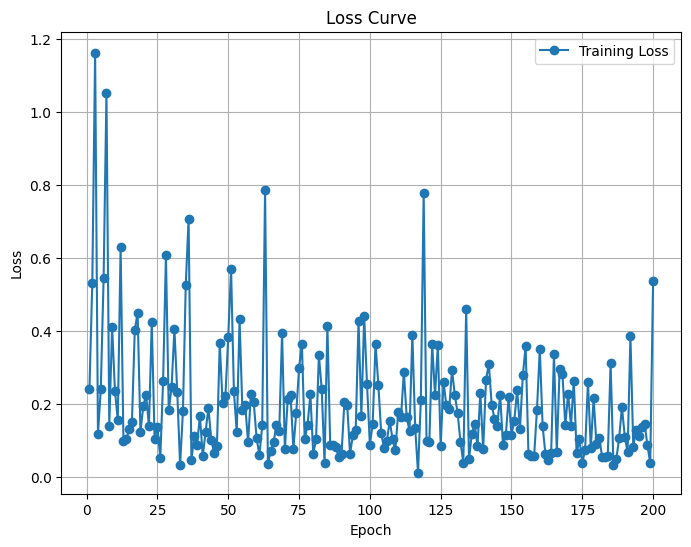

Predicted value for the first sample: 1.3286
Training Loss Scaling Unreversed: 0.3776230812072754
Training Loss Scaling Reversed: 2730.431640625


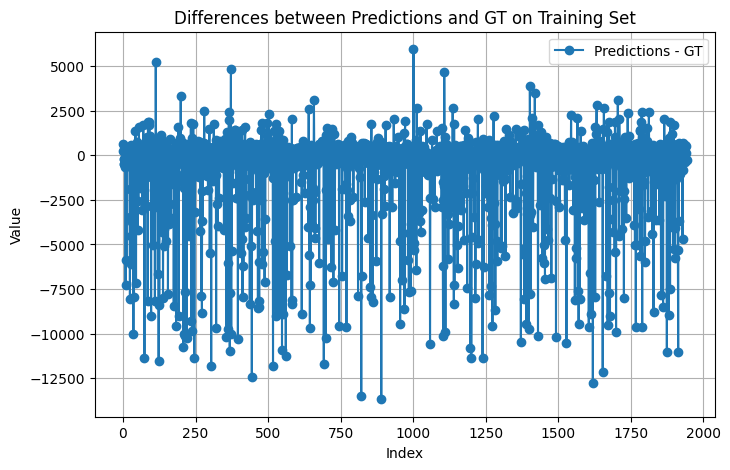

Predicted value for the first sample: 2.8352
Validation Loss Scaling Unreversed: 0.20534996688365936
Validation Loss Scaling Reversed: 1484.798095703125


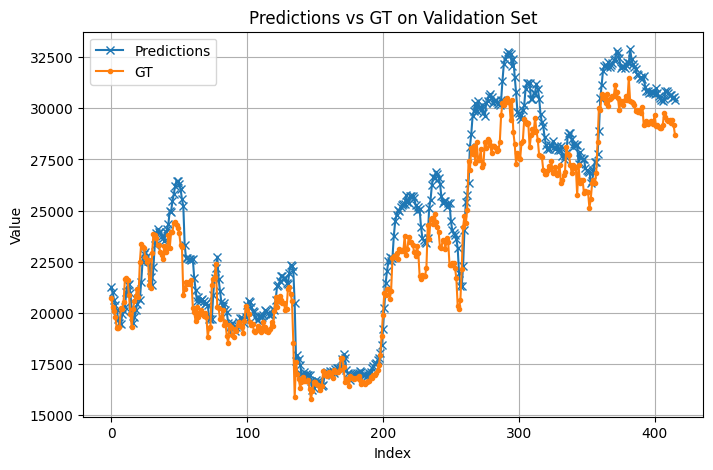

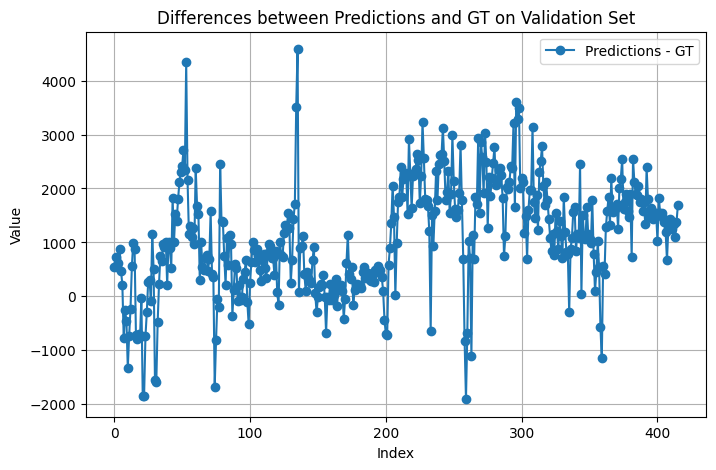

Return: 0.43407487869262695
Max Drawdown: -0.20088116824626923


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.3505
Epoch [10/200], Loss: 1.0329
Epoch [15/200], Loss: 0.4524
Epoch [20/200], Loss: 0.2185
Epoch [25/200], Loss: 0.3538
Epoch [30/200], Loss: 0.6617
Epoch [35/200], Loss: 0.2253
Epoch [40/200], Loss: 0.1925
Epoch [45/200], Loss: 0.8184
Epoch [50/200], Loss: 0.2200
Epoch [55/200], Loss: 0.1899
Epoch [60/200], Loss: 0.1570
Epoch [65/200], Loss: 0.1354
Epoch [70/200], Loss: 0.0694
Epoch [75/200], Loss: 0.1421
Epoch [80/200], Loss: 0.2364
Epoch [85/200], Loss: 0.1464
Epoch [90/200], Loss: 0.1705
Epoch [95/200], Loss: 0.1108
Epoch [100/200], Loss: 0.6012
Epoch [105/200], Loss: 1.0183
Epoch [110/200], Loss: 0.2874
Epoch [115/200], Loss: 0.1532
Epoch [120/200], Loss: 0.0738
Epoch [125/200], Loss: 0.3904
Epoch [130/200], Loss: 0.1645
Epoch [135/200], Loss: 0.6859
Epoch [140/200], Loss: 0.0671
Epoch [145/200], Loss: 0.0945
Epoch [150/200], Loss: 0.0562
Epoch [155/200], Loss: 0.1258
Epoch [160/200], Loss: 0.2621
Epoch [165/200], Loss: 0.2056
Epoch [170/200], Loss: 0.2765


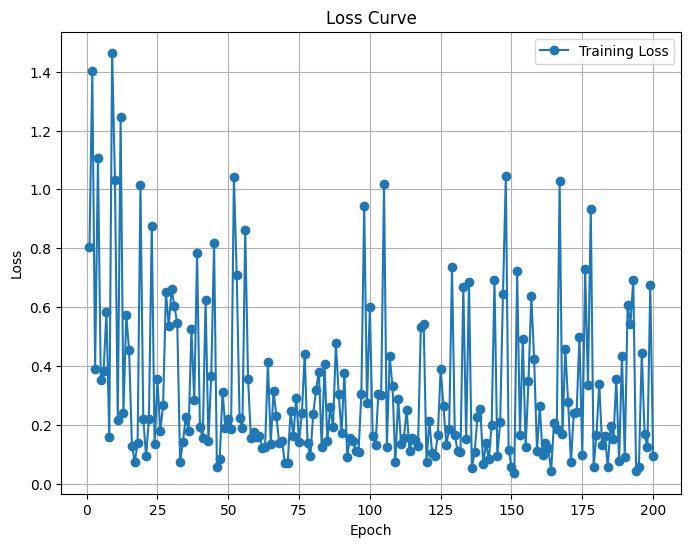

Predicted value for the first sample: 1.1202
Training Loss Scaling Unreversed: 0.35234299302101135
Training Loss Scaling Reversed: 2547.642333984375


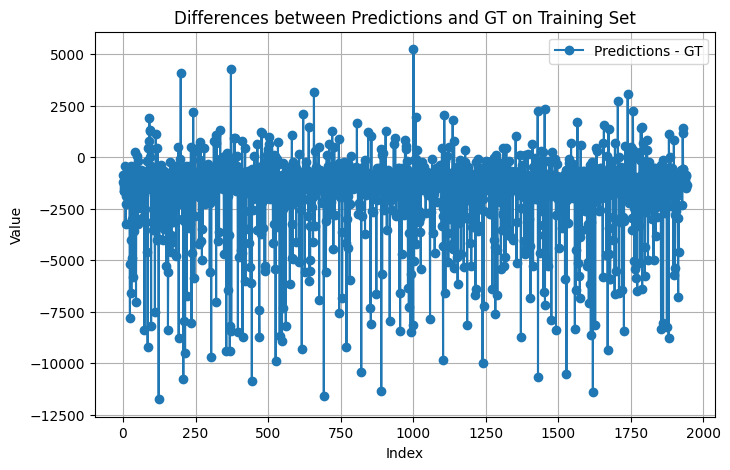

Predicted value for the first sample: 2.3637
Validation Loss Scaling Unreversed: 0.2388153076171875
Validation Loss Scaling Reversed: 1726.7718505859375


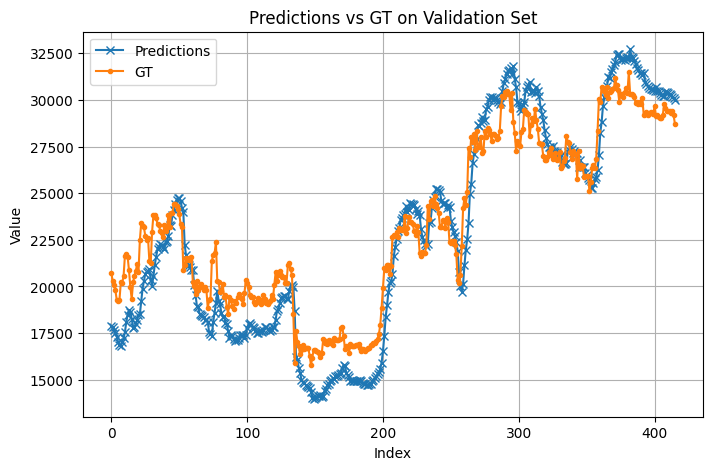

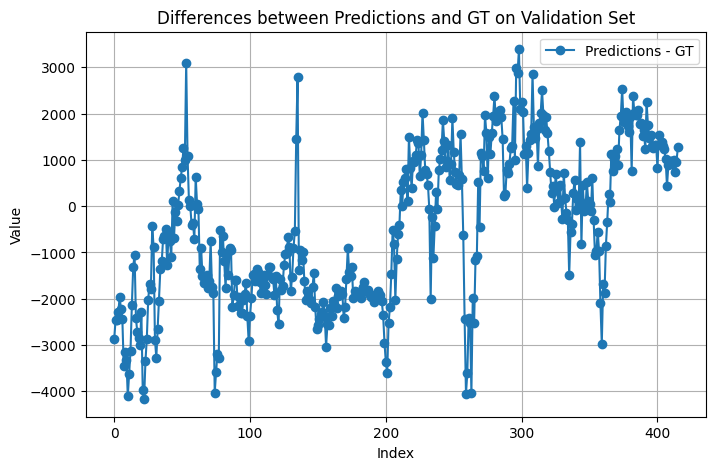

Return: 0.6533045768737793
Max Drawdown: -0.23659873008728027


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.6829
Epoch [10/200], Loss: 0.7730
Epoch [15/200], Loss: 3.8423
Epoch [20/200], Loss: 3.8295
Epoch [25/200], Loss: 0.5288
Epoch [30/200], Loss: 0.7448
Epoch [35/200], Loss: 1.0612
Epoch [40/200], Loss: 1.5510
Epoch [45/200], Loss: 4.0227
Epoch [50/200], Loss: 1.9334
Epoch [55/200], Loss: 3.4544
Epoch [60/200], Loss: 0.5649
Epoch [65/200], Loss: 2.8796
Epoch [70/200], Loss: 0.7223
Epoch [75/200], Loss: 1.2129
Epoch [80/200], Loss: 2.1202
Epoch [85/200], Loss: 2.4626
Epoch [90/200], Loss: 0.6596
Epoch [95/200], Loss: 2.1228
Epoch [100/200], Loss: 1.4345
Epoch [105/200], Loss: 1.0932
Epoch [110/200], Loss: 0.9546
Epoch [115/200], Loss: 4.8472
Epoch [120/200], Loss: 3.1321
Epoch [125/200], Loss: 0.8903
Epoch [130/200], Loss: 2.8006
Epoch [135/200], Loss: 2.8410
Epoch [140/200], Loss: 2.3051
Epoch [145/200], Loss: 2.0497
Epoch [150/200], Loss: 1.7172
Epoch [155/200], Loss: 2.0792
Epoch [160/200], Loss: 2.9502
Epoch [165/200], Loss: 3.7144
Epoch [170/200], Loss: 1.2962


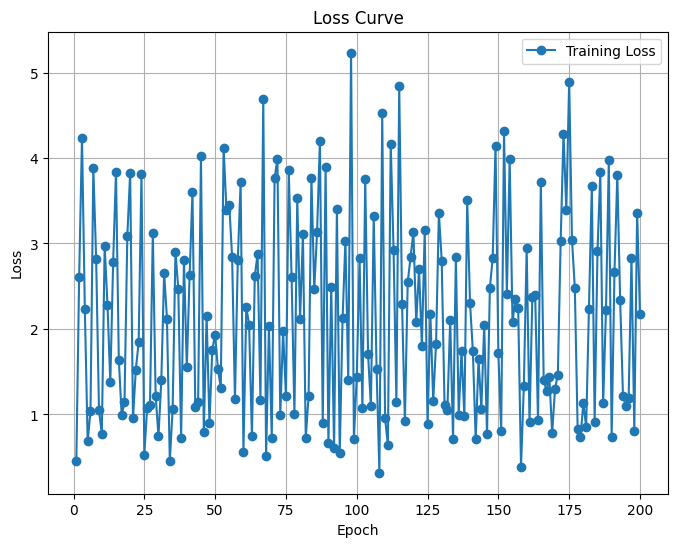

Predicted value for the first sample: 2.3411
Training Loss Scaling Unreversed: 2.4206788539886475
Training Loss Scaling Reversed: 17502.8984375


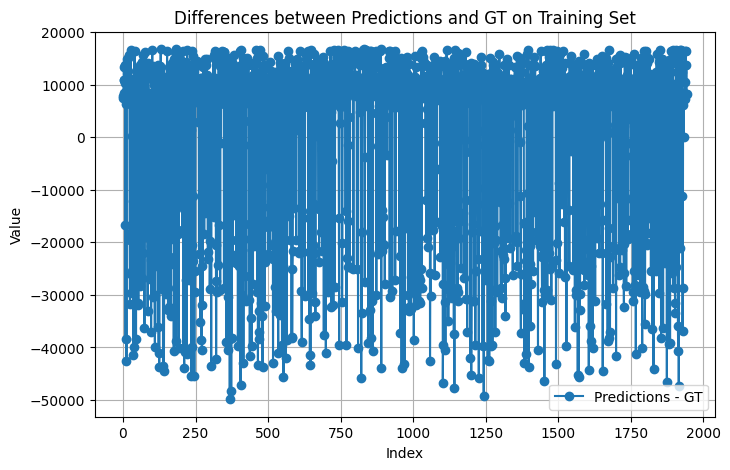

Predicted value for the first sample: 2.3411
Validation Loss Scaling Unreversed: 0.9997524619102478
Validation Loss Scaling Reversed: 7228.7841796875


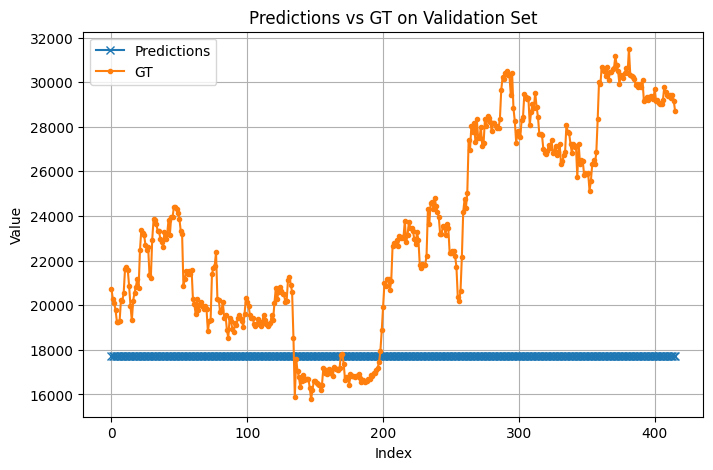

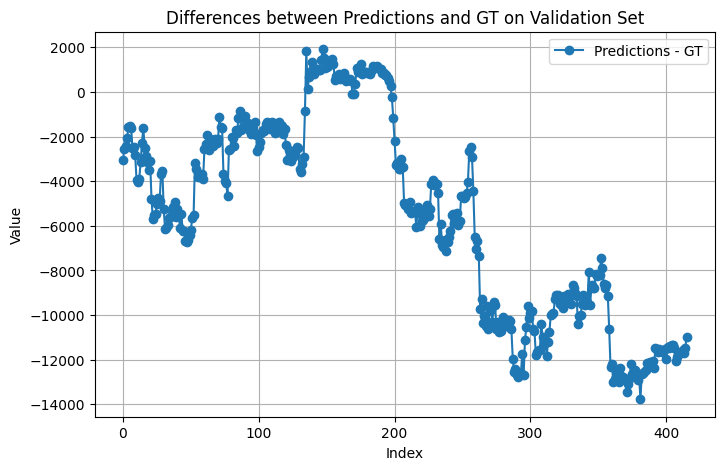

Return: 0.027675867080688477
Max Drawdown: -0.3171757161617279


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.5939
Epoch [10/200], Loss: 0.6289
Epoch [15/200], Loss: 0.1509
Epoch [20/200], Loss: 0.4777
Epoch [25/200], Loss: 0.0870
Epoch [30/200], Loss: 0.2734
Epoch [35/200], Loss: 0.4903
Epoch [40/200], Loss: 0.3695
Epoch [45/200], Loss: 1.2358
Epoch [50/200], Loss: 0.2898
Epoch [55/200], Loss: 0.2650
Epoch [60/200], Loss: 0.3746
Epoch [65/200], Loss: 0.1240
Epoch [70/200], Loss: 0.2596
Epoch [75/200], Loss: 0.0699
Epoch [80/200], Loss: 0.4603
Epoch [85/200], Loss: 0.0807
Epoch [90/200], Loss: 0.1830
Epoch [95/200], Loss: 0.2890
Epoch [100/200], Loss: 0.1183
Epoch [105/200], Loss: 0.1514
Epoch [110/200], Loss: 0.1149
Epoch [115/200], Loss: 0.0179
Epoch [120/200], Loss: 0.1653
Epoch [125/200], Loss: 0.3339
Epoch [130/200], Loss: 0.1073
Epoch [135/200], Loss: 0.3333
Epoch [140/200], Loss: 0.1834
Epoch [145/200], Loss: 0.8462
Epoch [150/200], Loss: 0.1059
Epoch [155/200], Loss: 0.0632
Epoch [160/200], Loss: 0.2061
Epoch [165/200], Loss: 0.1733
Epoch [170/200], Loss: 0.3481


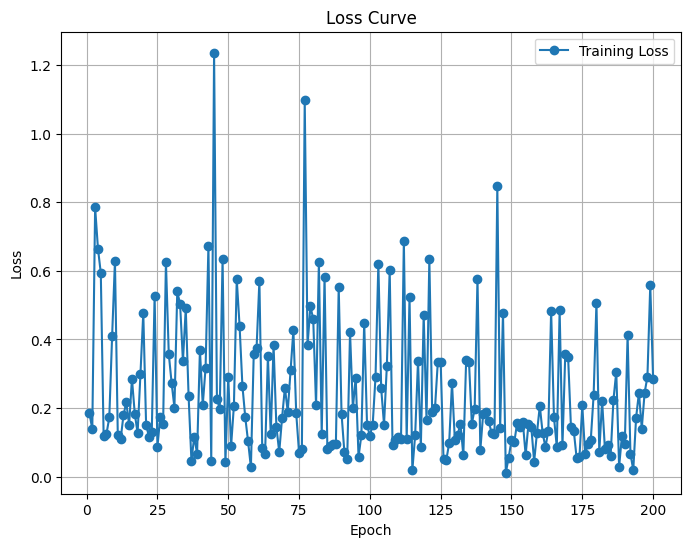

Predicted value for the first sample: 1.3504
Training Loss Scaling Unreversed: 0.21386432647705078
Training Loss Scaling Reversed: 1546.3619384765625


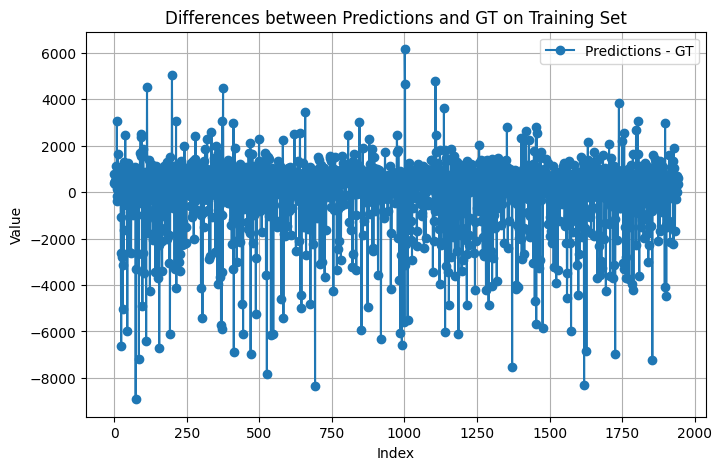

Predicted value for the first sample: 2.4245
Validation Loss Scaling Unreversed: 0.22587233781814575
Validation Loss Scaling Reversed: 1633.1866455078125


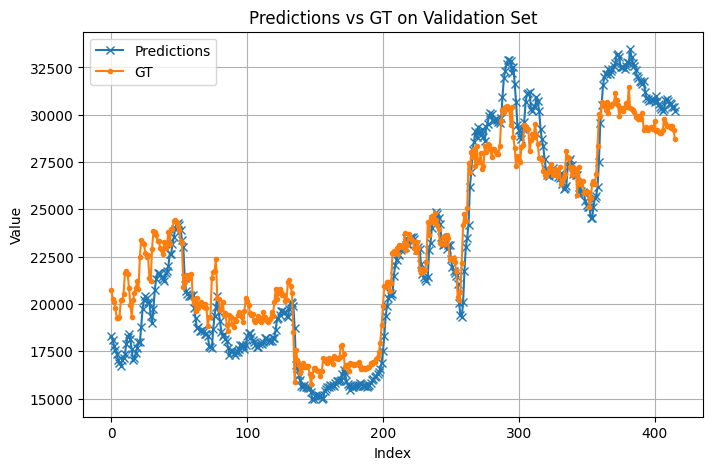

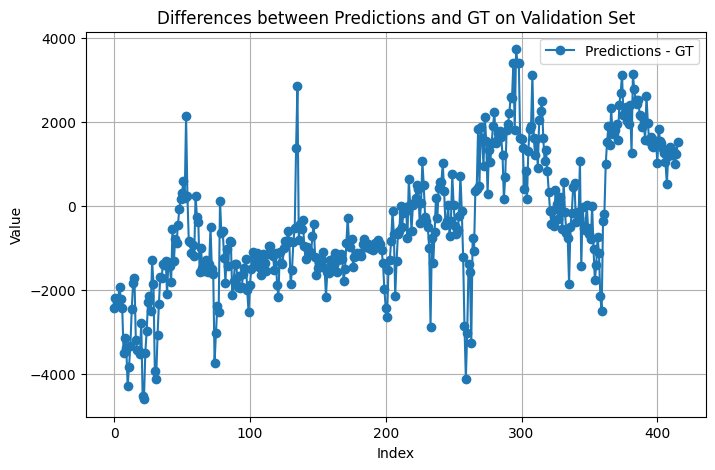

Return: 0.3679211139678955
Max Drawdown: -0.20520944893360138


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.2976
Epoch [10/200], Loss: 0.4631
Epoch [15/200], Loss: 0.6979
Epoch [20/200], Loss: 0.3161
Epoch [25/200], Loss: 0.2737
Epoch [30/200], Loss: 0.3048
Epoch [35/200], Loss: 0.3639
Epoch [40/200], Loss: 0.2021
Epoch [45/200], Loss: 0.1974
Epoch [50/200], Loss: 0.2540
Epoch [55/200], Loss: 0.2675
Epoch [60/200], Loss: 0.4088
Epoch [65/200], Loss: 0.3095
Epoch [70/200], Loss: 0.7262
Epoch [75/200], Loss: 0.1512
Epoch [80/200], Loss: 0.4846
Epoch [85/200], Loss: 0.2227
Epoch [90/200], Loss: 0.2749
Epoch [95/200], Loss: 0.3718
Epoch [100/200], Loss: 0.7287
Epoch [105/200], Loss: 0.2697
Epoch [110/200], Loss: 0.8497
Epoch [115/200], Loss: 0.3157
Epoch [120/200], Loss: 0.0985
Epoch [125/200], Loss: 0.0528
Epoch [130/200], Loss: 0.0763
Epoch [135/200], Loss: 0.0777
Epoch [140/200], Loss: 0.2569
Epoch [145/200], Loss: 0.3710
Epoch [150/200], Loss: 0.1505
Epoch [155/200], Loss: 0.4832
Epoch [160/200], Loss: 0.3130
Epoch [165/200], Loss: 0.1073
Epoch [170/200], Loss: 0.1336


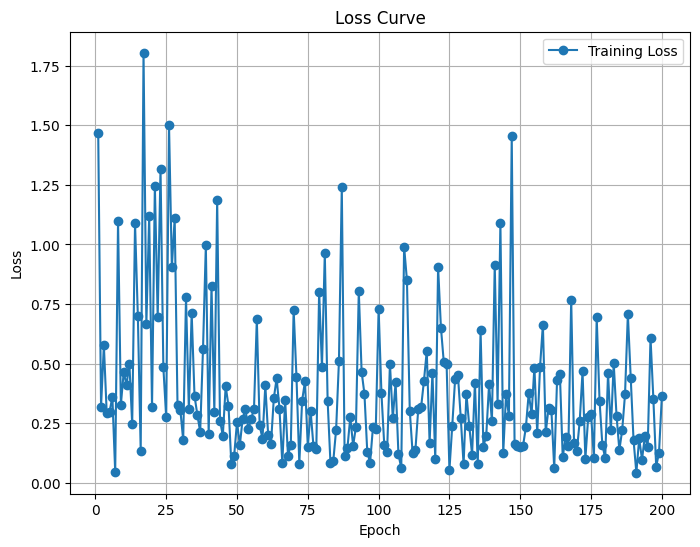

Predicted value for the first sample: 1.3129
Training Loss Scaling Unreversed: 0.4017614722251892
Training Loss Scaling Reversed: 2904.9658203125


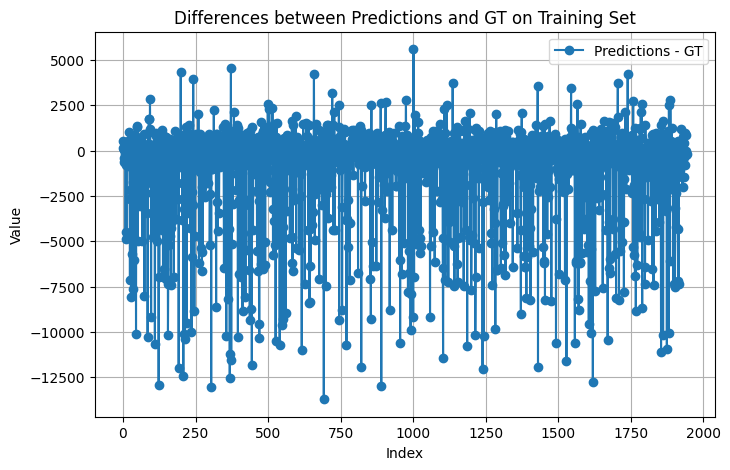

Predicted value for the first sample: 2.4559
Validation Loss Scaling Unreversed: 0.24504369497299194
Validation Loss Scaling Reversed: 1771.8065185546875


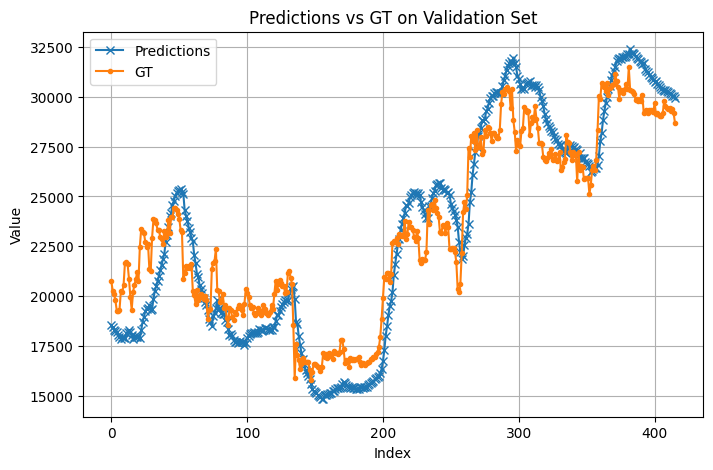

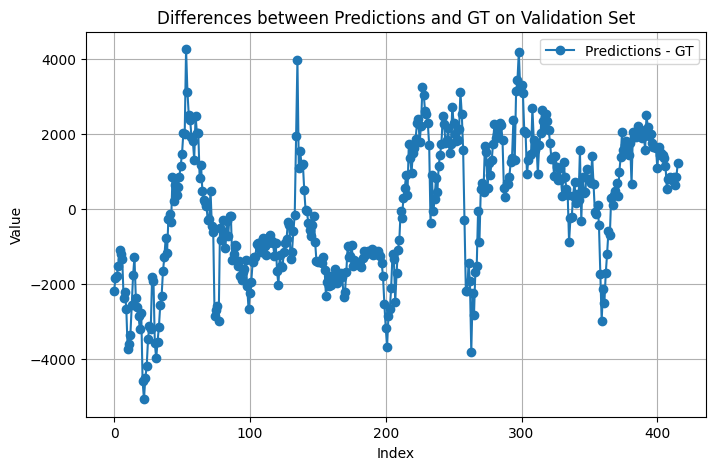

Return: 0.29631948471069336
Max Drawdown: -0.21847060322761536


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.3544
Epoch [10/200], Loss: 0.3040
Epoch [15/200], Loss: 0.3121
Epoch [20/200], Loss: 0.1494
Epoch [25/200], Loss: 0.2534
Epoch [30/200], Loss: 0.4104
Epoch [35/200], Loss: 0.2076
Epoch [40/200], Loss: 0.0951
Epoch [45/200], Loss: 0.1573
Epoch [50/200], Loss: 0.1548
Epoch [55/200], Loss: 0.1602
Epoch [60/200], Loss: 0.1404
Epoch [65/200], Loss: 0.1781
Epoch [70/200], Loss: 0.1811
Epoch [75/200], Loss: 0.1549
Epoch [80/200], Loss: 0.1854
Epoch [85/200], Loss: 0.1831
Epoch [90/200], Loss: 0.1622
Epoch [95/200], Loss: 0.1044
Epoch [100/200], Loss: 0.1819
Epoch [105/200], Loss: 0.0937
Epoch [110/200], Loss: 0.1823
Epoch [115/200], Loss: 0.2480
Epoch [120/200], Loss: 0.1420
Epoch [125/200], Loss: 0.4039
Epoch [130/200], Loss: 0.1160
Epoch [135/200], Loss: 0.1625
Epoch [140/200], Loss: 0.1846
Epoch [145/200], Loss: 0.3069
Epoch [150/200], Loss: 0.2095
Epoch [155/200], Loss: 0.0719
Epoch [160/200], Loss: 0.1556
Epoch [165/200], Loss: 0.0687
Epoch [170/200], Loss: 0.1039


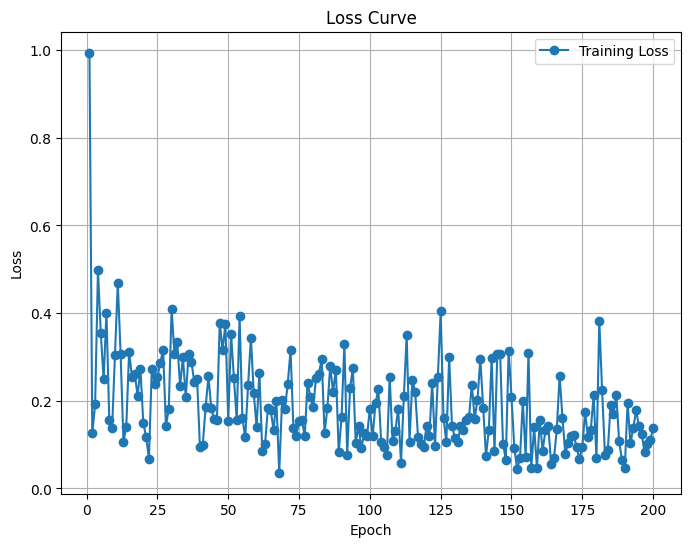

Predicted value for the first sample: 1.3564
Training Loss Scaling Unreversed: 0.1476796716451645
Training Loss Scaling Reversed: 1067.808837890625


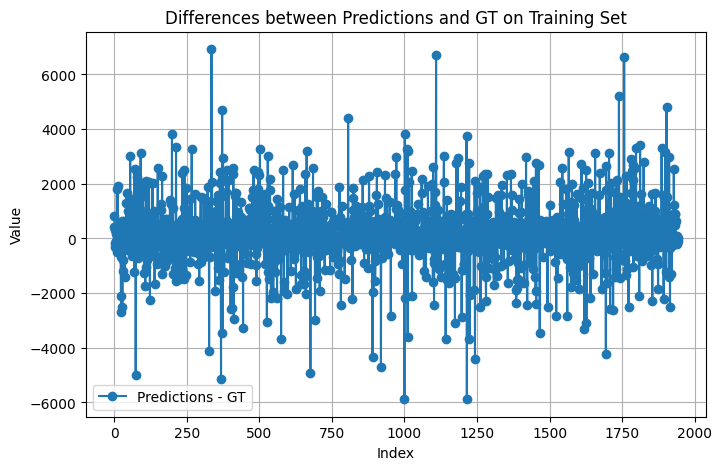

Predicted value for the first sample: 3.0129
Validation Loss Scaling Unreversed: 0.2808011770248413
Validation Loss Scaling Reversed: 2030.353759765625


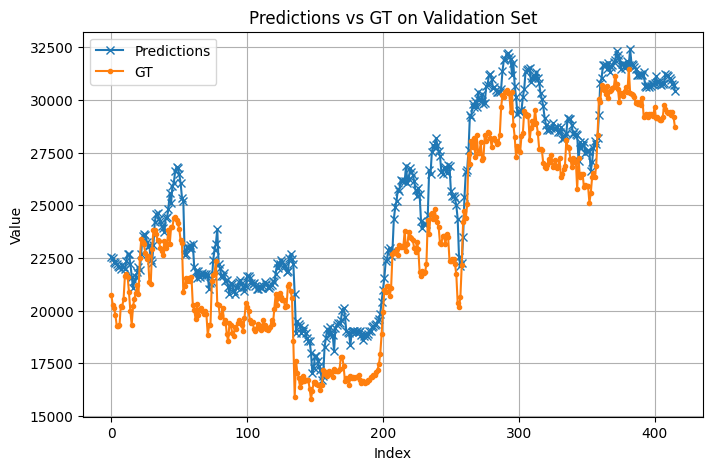

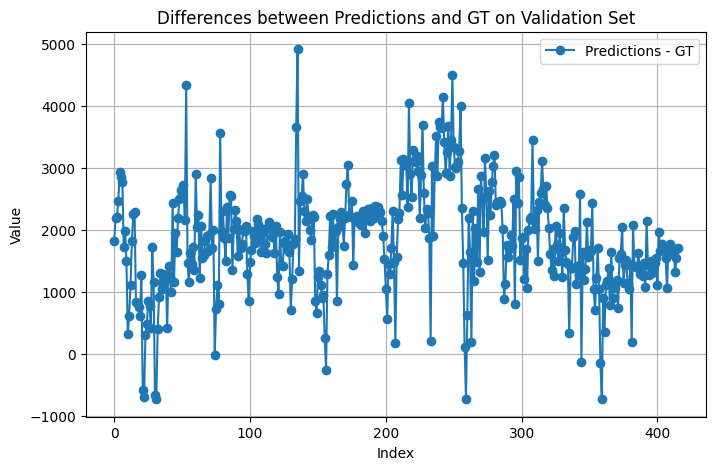

Return: 0.5379528999328613
Max Drawdown: -0.1638389676809311


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.3636
Epoch [10/200], Loss: 0.0935
Epoch [15/200], Loss: 0.2465
Epoch [20/200], Loss: 0.2356
Epoch [25/200], Loss: 0.1962
Epoch [30/200], Loss: 0.1711
Epoch [35/200], Loss: 0.1443
Epoch [40/200], Loss: 0.2669
Epoch [45/200], Loss: 0.1552
Epoch [50/200], Loss: 0.3730
Epoch [55/200], Loss: 0.3058
Epoch [60/200], Loss: 0.1794
Epoch [65/200], Loss: 0.0911
Epoch [70/200], Loss: 0.1631
Epoch [75/200], Loss: 0.1189
Epoch [80/200], Loss: 0.6365
Epoch [85/200], Loss: 0.3293
Epoch [90/200], Loss: 0.3395
Epoch [95/200], Loss: 0.1031
Epoch [100/200], Loss: 0.1110
Epoch [105/200], Loss: 0.2906
Epoch [110/200], Loss: 0.3370
Epoch [115/200], Loss: 0.3628
Epoch [120/200], Loss: 0.2861
Epoch [125/200], Loss: 0.1875
Epoch [130/200], Loss: 0.2692
Epoch [135/200], Loss: 0.1385
Epoch [140/200], Loss: 0.0707
Epoch [145/200], Loss: 0.1035
Epoch [150/200], Loss: 0.0548
Epoch [155/200], Loss: 0.2158
Epoch [160/200], Loss: 0.1682
Epoch [165/200], Loss: 0.0791
Epoch [170/200], Loss: 0.1130


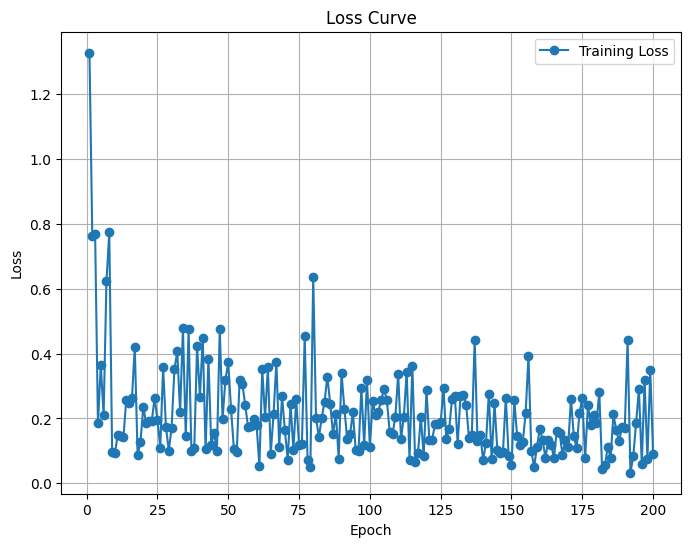

Predicted value for the first sample: 1.2868
Training Loss Scaling Unreversed: 0.17386898398399353
Training Loss Scaling Reversed: 1257.172607421875


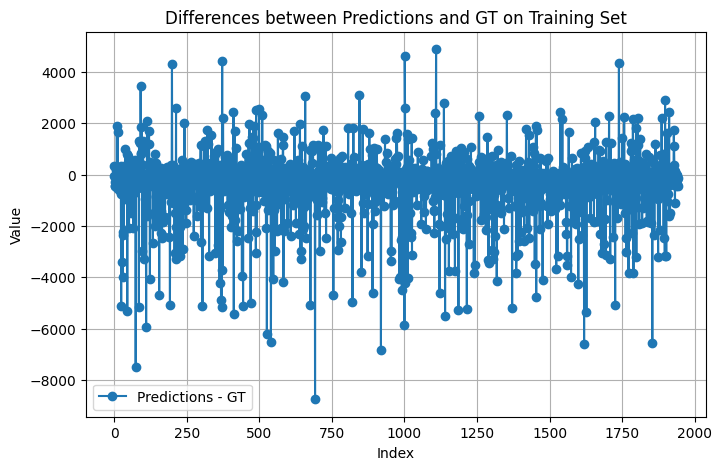

Predicted value for the first sample: 2.9271
Validation Loss Scaling Unreversed: 0.15580949187278748
Validation Loss Scaling Reversed: 1126.592041015625


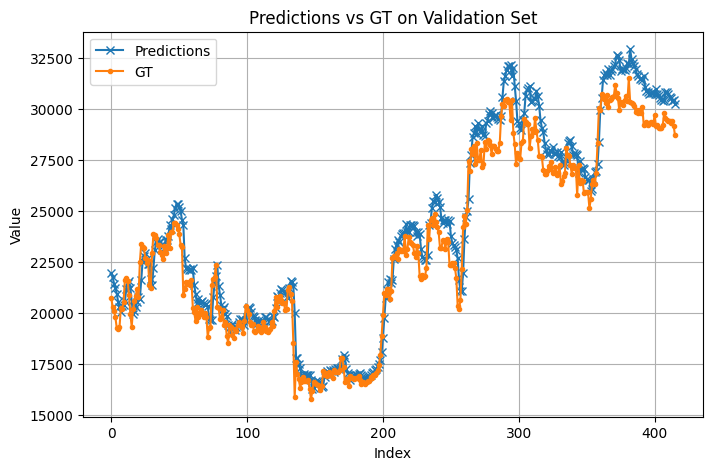

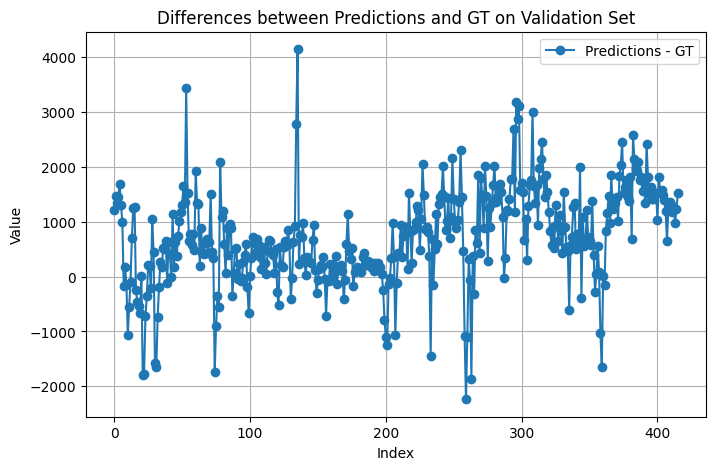

Return: 0.2416839599609375
Max Drawdown: -0.2272181212902069


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.4385
Epoch [10/200], Loss: 0.6683
Epoch [15/200], Loss: 1.3722
Epoch [20/200], Loss: 1.0892
Epoch [25/200], Loss: 0.1147
Epoch [30/200], Loss: 1.1555
Epoch [35/200], Loss: 0.3690
Epoch [40/200], Loss: 0.1223
Epoch [45/200], Loss: 0.1634
Epoch [50/200], Loss: 0.2786
Epoch [55/200], Loss: 0.2205
Epoch [60/200], Loss: 0.1956
Epoch [65/200], Loss: 0.2626
Epoch [70/200], Loss: 0.6445
Epoch [75/200], Loss: 0.3004
Epoch [80/200], Loss: 0.3158
Epoch [85/200], Loss: 0.1083
Epoch [90/200], Loss: 0.2505
Epoch [95/200], Loss: 0.3215
Epoch [100/200], Loss: 0.1255
Epoch [105/200], Loss: 0.1113
Epoch [110/200], Loss: 0.2016
Epoch [115/200], Loss: 0.1422
Epoch [120/200], Loss: 0.1277
Epoch [125/200], Loss: 0.1660
Epoch [130/200], Loss: 0.1108
Epoch [135/200], Loss: 0.5251
Epoch [140/200], Loss: 0.3929
Epoch [145/200], Loss: 0.3760
Epoch [150/200], Loss: 0.3233
Epoch [155/200], Loss: 0.3187
Epoch [160/200], Loss: 0.2860
Epoch [165/200], Loss: 0.2322
Epoch [170/200], Loss: 0.2198


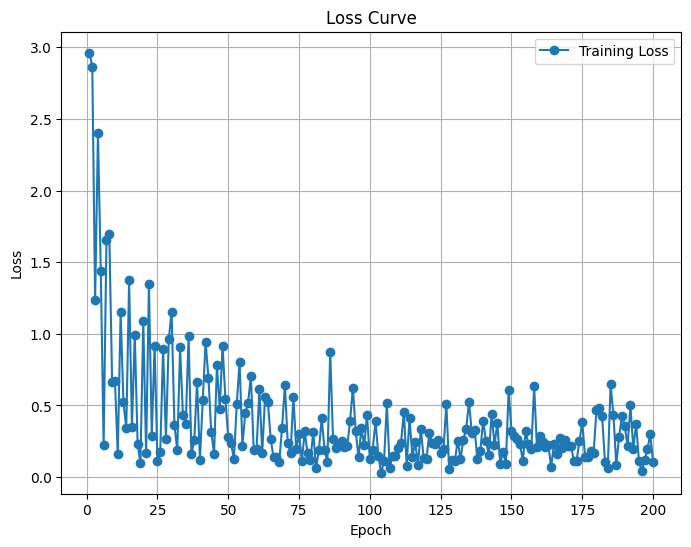

Predicted value for the first sample: 1.2119
Training Loss Scaling Unreversed: 0.216183140873909
Training Loss Scaling Reversed: 1563.1282958984375


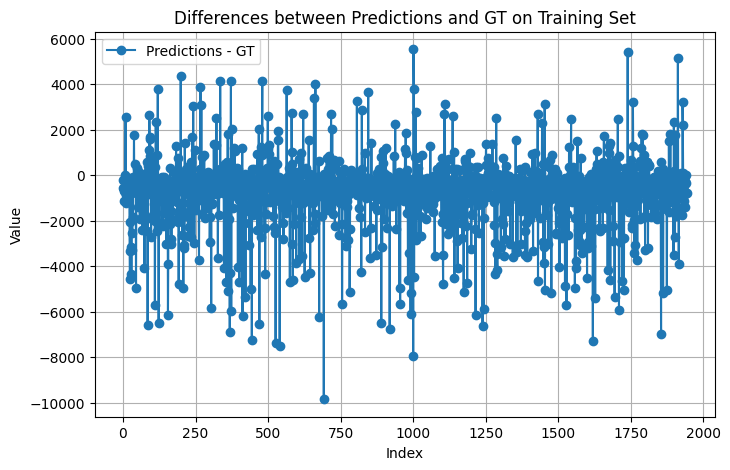

Predicted value for the first sample: 2.5111
Validation Loss Scaling Unreversed: 0.19025546312332153
Validation Loss Scaling Reversed: 1375.65625


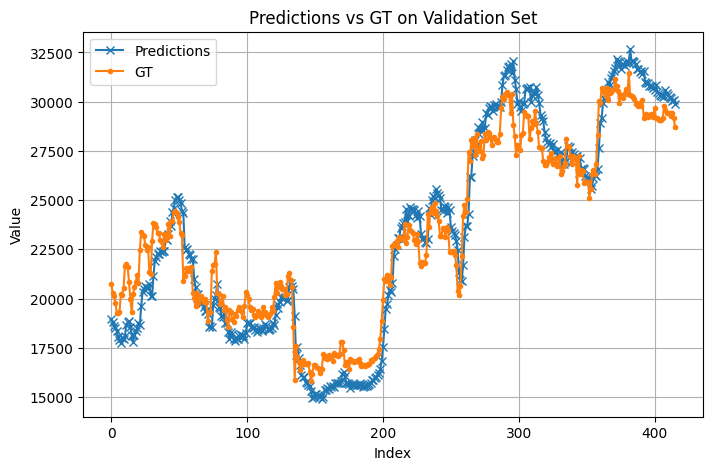

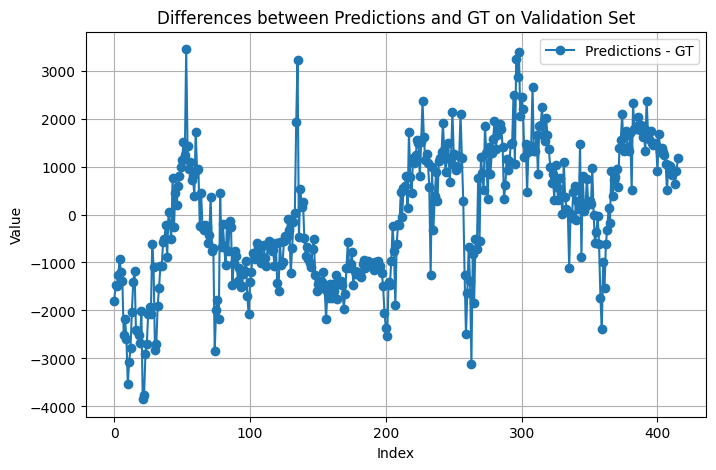

Return: 0.20891475677490234
Max Drawdown: -0.22877472639083862


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.1518
Epoch [10/200], Loss: 0.5283
Epoch [15/200], Loss: 0.7657
Epoch [20/200], Loss: 0.6909
Epoch [25/200], Loss: 0.1825
Epoch [30/200], Loss: 0.1348
Epoch [35/200], Loss: 0.2226
Epoch [40/200], Loss: 0.3917
Epoch [45/200], Loss: 0.1513
Epoch [50/200], Loss: 0.2074
Epoch [55/200], Loss: 0.1820
Epoch [60/200], Loss: 0.3285
Epoch [65/200], Loss: 0.2445
Epoch [70/200], Loss: 0.1687
Epoch [75/200], Loss: 0.2128
Epoch [80/200], Loss: 0.2833
Epoch [85/200], Loss: 0.5633
Epoch [90/200], Loss: 0.3838
Epoch [95/200], Loss: 0.1642
Epoch [100/200], Loss: 0.2857
Epoch [105/200], Loss: 0.2465
Epoch [110/200], Loss: 0.1976
Epoch [115/200], Loss: 0.2564
Epoch [120/200], Loss: 0.1333
Epoch [125/200], Loss: 0.2332
Epoch [130/200], Loss: 0.2262
Epoch [135/200], Loss: 0.0424
Epoch [140/200], Loss: 0.3337
Epoch [145/200], Loss: 0.2078
Epoch [150/200], Loss: 0.0627
Epoch [155/200], Loss: 0.1449
Epoch [160/200], Loss: 0.2267
Epoch [165/200], Loss: 0.2178
Epoch [170/200], Loss: 0.1969


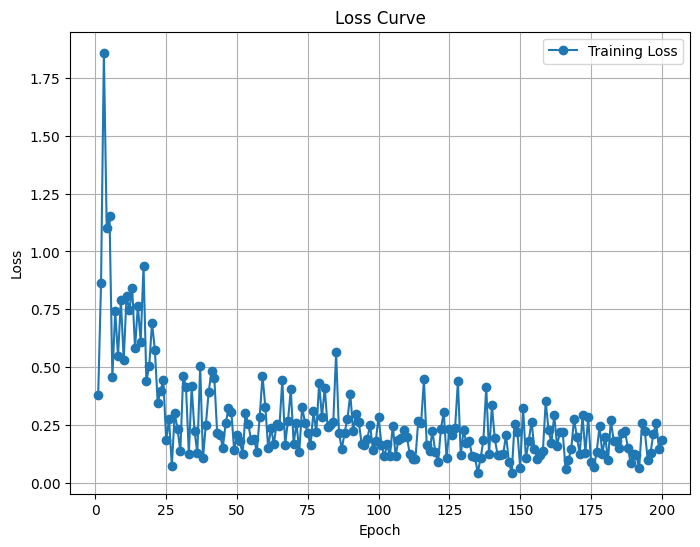

Predicted value for the first sample: 1.2693
Training Loss Scaling Unreversed: 0.24832068383693695
Training Loss Scaling Reversed: 1795.5010986328125


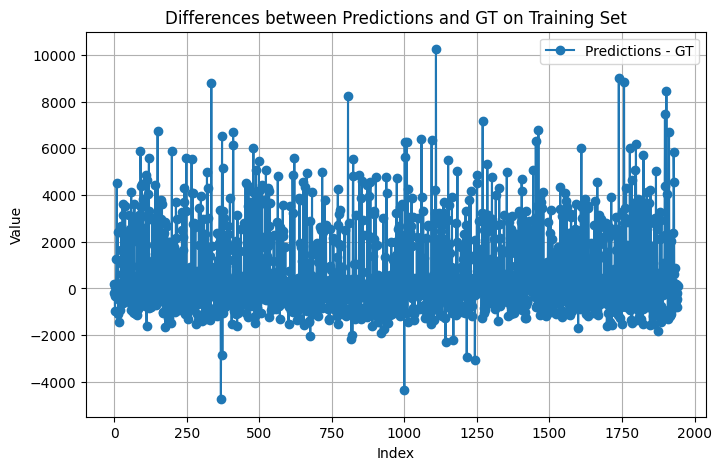

Predicted value for the first sample: 3.0132
Validation Loss Scaling Unreversed: 0.34361523389816284
Validation Loss Scaling Reversed: 2484.53564453125


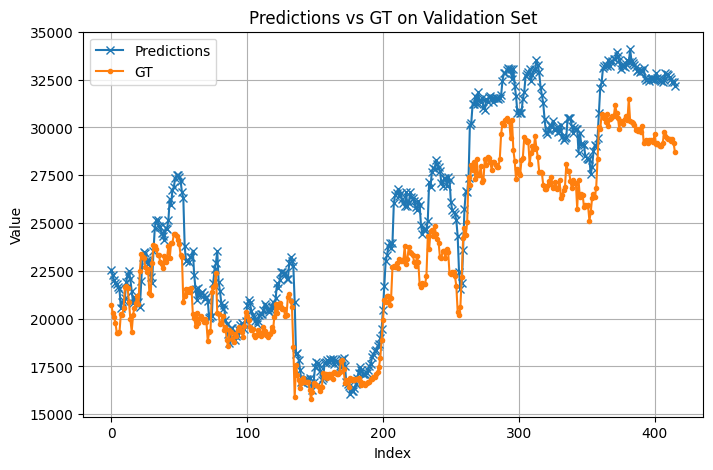

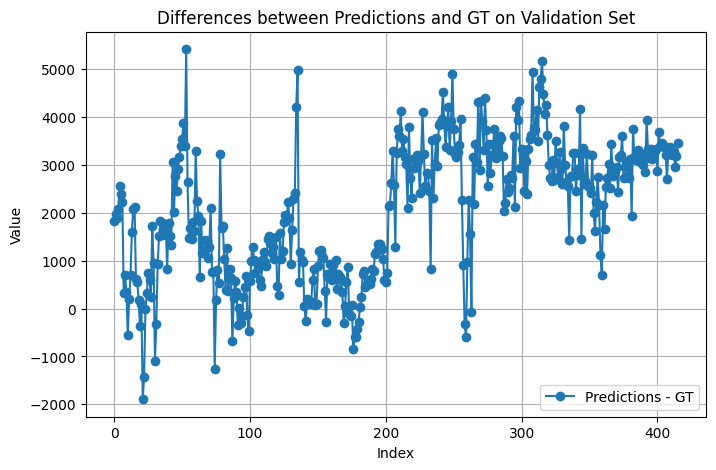

Return: 0.2748229503631592
Max Drawdown: -0.21311229467391968


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.2262
Epoch [10/200], Loss: 0.3798
Epoch [15/200], Loss: 0.2389
Epoch [20/200], Loss: 0.3764
Epoch [25/200], Loss: 0.4173
Epoch [30/200], Loss: 0.2469
Epoch [35/200], Loss: 0.4738
Epoch [40/200], Loss: 0.2092
Epoch [45/200], Loss: 0.3375
Epoch [50/200], Loss: 0.2965
Epoch [55/200], Loss: 0.1634
Epoch [60/200], Loss: 0.1763
Epoch [65/200], Loss: 0.2057
Epoch [70/200], Loss: 0.2942
Epoch [75/200], Loss: 0.4234
Epoch [80/200], Loss: 0.2136
Epoch [85/200], Loss: 0.2009
Epoch [90/200], Loss: 0.2256
Epoch [95/200], Loss: 0.4141
Epoch [100/200], Loss: 0.4058
Epoch [105/200], Loss: 0.1185
Epoch [110/200], Loss: 0.3238
Epoch [115/200], Loss: 0.2275
Epoch [120/200], Loss: 0.4468
Epoch [125/200], Loss: 0.1042
Epoch [130/200], Loss: 0.1968
Epoch [135/200], Loss: 0.1777
Epoch [140/200], Loss: 0.1244
Epoch [145/200], Loss: 0.1683
Epoch [150/200], Loss: 0.2352
Epoch [155/200], Loss: 0.1463
Epoch [160/200], Loss: 0.2381
Epoch [165/200], Loss: 0.1023
Epoch [170/200], Loss: 0.2907


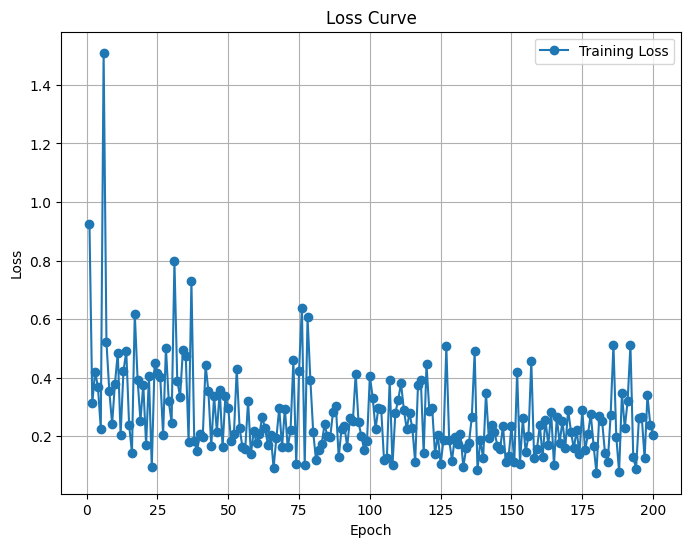

Predicted value for the first sample: 1.2386
Training Loss Scaling Unreversed: 0.5330280065536499
Training Loss Scaling Reversed: 3854.09814453125


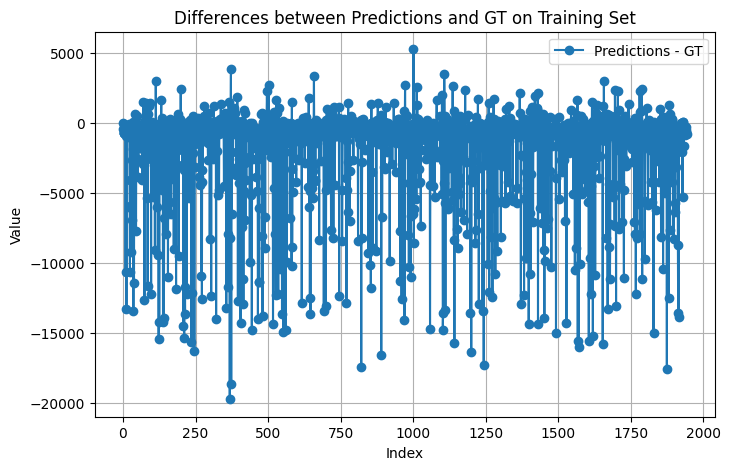

Predicted value for the first sample: 2.6554
Validation Loss Scaling Unreversed: 0.2556966543197632
Validation Loss Scaling Reversed: 1848.8333740234375


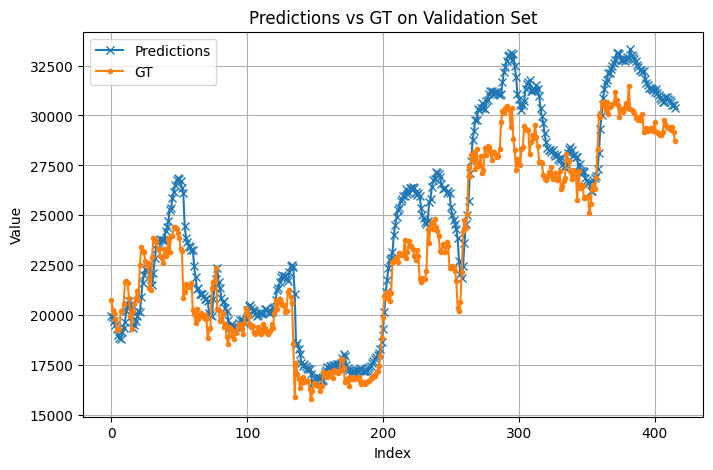

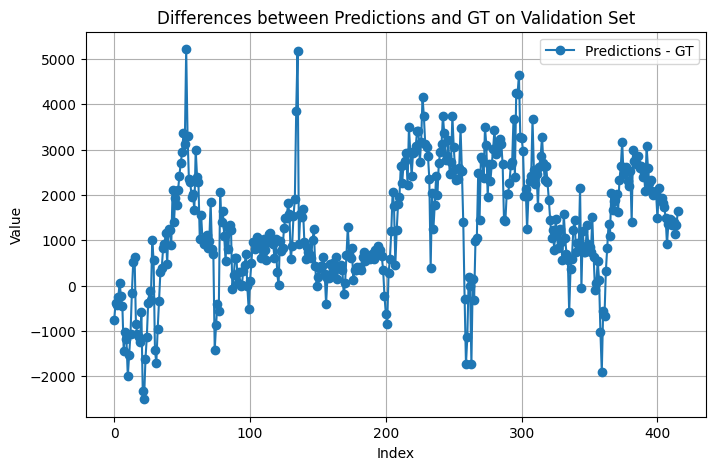

Return: 0.4245215654373169
Max Drawdown: -0.20695936679840088


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.2947
Epoch [10/200], Loss: 1.0804
Epoch [15/200], Loss: 0.9875
Epoch [20/200], Loss: 0.5439
Epoch [25/200], Loss: 0.4179
Epoch [30/200], Loss: 0.9006
Epoch [35/200], Loss: 0.5756
Epoch [40/200], Loss: 0.3463
Epoch [45/200], Loss: 0.3893
Epoch [50/200], Loss: 0.6659
Epoch [55/200], Loss: 0.2542
Epoch [60/200], Loss: 0.2375
Epoch [65/200], Loss: 0.6077
Epoch [70/200], Loss: 0.4654
Epoch [75/200], Loss: 0.3833
Epoch [80/200], Loss: 0.2330
Epoch [85/200], Loss: 0.5168
Epoch [90/200], Loss: 0.2039
Epoch [95/200], Loss: 0.1977
Epoch [100/200], Loss: 0.4579
Epoch [105/200], Loss: 0.6625
Epoch [110/200], Loss: 0.4723
Epoch [115/200], Loss: 0.3749
Epoch [120/200], Loss: 0.3710
Epoch [125/200], Loss: 0.1595
Epoch [130/200], Loss: 0.4506
Epoch [135/200], Loss: 0.3673
Epoch [140/200], Loss: 0.8379
Epoch [145/200], Loss: 0.4072
Epoch [150/200], Loss: 0.0956
Epoch [155/200], Loss: 0.4007
Epoch [160/200], Loss: 0.1084
Epoch [165/200], Loss: 0.4114
Epoch [170/200], Loss: 0.6631


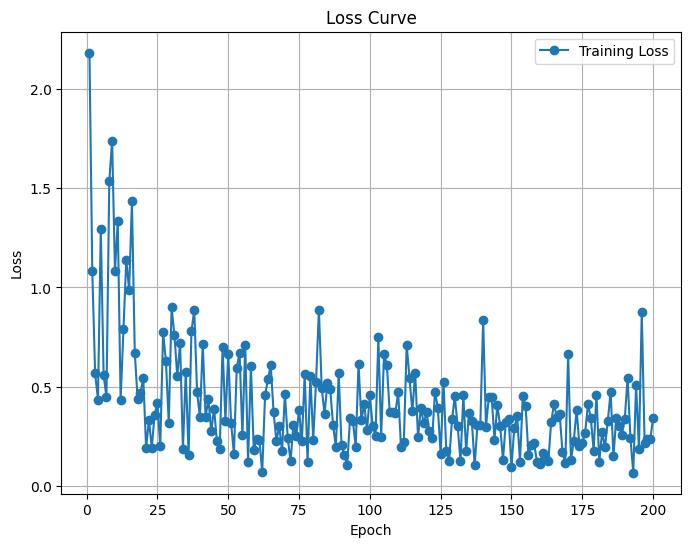

Predicted value for the first sample: 1.1849
Training Loss Scaling Unreversed: 0.39616596698760986
Training Loss Scaling Reversed: 2864.50732421875


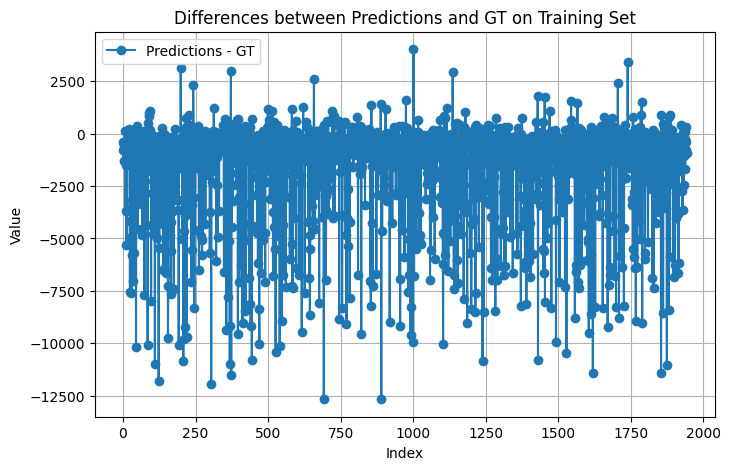

Predicted value for the first sample: 2.3927
Validation Loss Scaling Unreversed: 0.26626384258270264
Validation Loss Scaling Reversed: 1925.240478515625


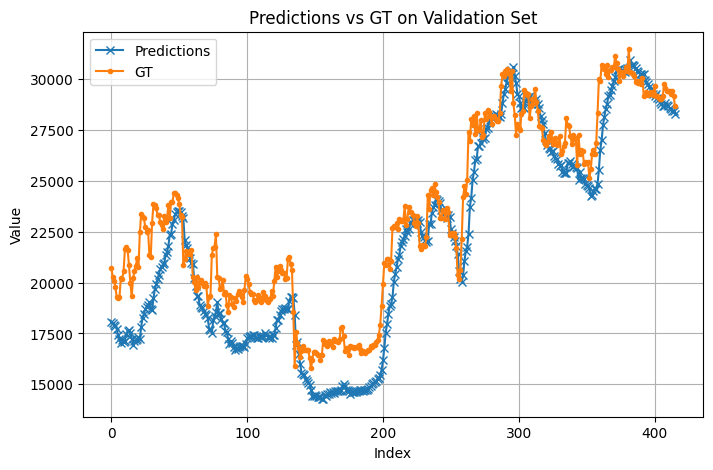

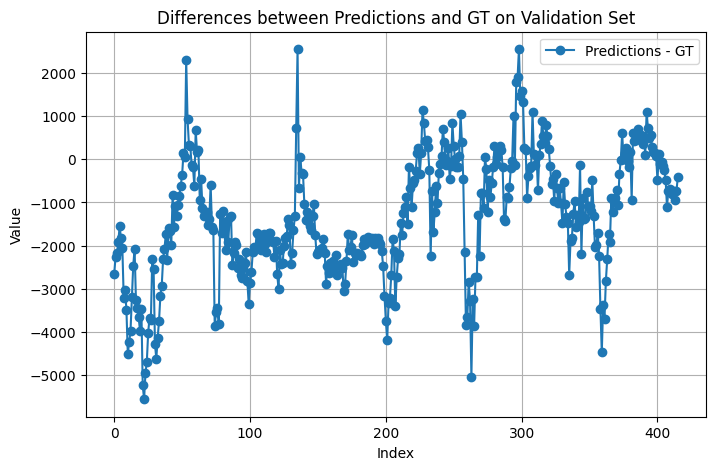

Return: 0.4527996778488159
Max Drawdown: -0.19989213347434998


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4181
Epoch [10/200], Loss: 0.6137
Epoch [15/200], Loss: 0.3469
Epoch [20/200], Loss: 0.5632
Epoch [25/200], Loss: 0.2798
Epoch [30/200], Loss: 0.2796
Epoch [35/200], Loss: 0.3499
Epoch [40/200], Loss: 0.4016
Epoch [45/200], Loss: 0.3817
Epoch [50/200], Loss: 0.3223
Epoch [55/200], Loss: 0.2789
Epoch [60/200], Loss: 0.1635
Epoch [65/200], Loss: 0.1817
Epoch [70/200], Loss: 0.2202
Epoch [75/200], Loss: 0.2210
Epoch [80/200], Loss: 0.2819
Epoch [85/200], Loss: 0.1479
Epoch [90/200], Loss: 0.2110
Epoch [95/200], Loss: 0.3099
Epoch [100/200], Loss: 0.1529
Epoch [105/200], Loss: 0.2341
Epoch [110/200], Loss: 0.1444
Epoch [115/200], Loss: 0.3136
Epoch [120/200], Loss: 0.3960
Epoch [125/200], Loss: 0.3036
Epoch [130/200], Loss: 0.3445
Epoch [135/200], Loss: 0.1245
Epoch [140/200], Loss: 0.2155
Epoch [145/200], Loss: 0.4103
Epoch [150/200], Loss: 0.4009
Epoch [155/200], Loss: 0.3058
Epoch [160/200], Loss: 0.3753
Epoch [165/200], Loss: 0.2313
Epoch [170/200], Loss: 0.1206


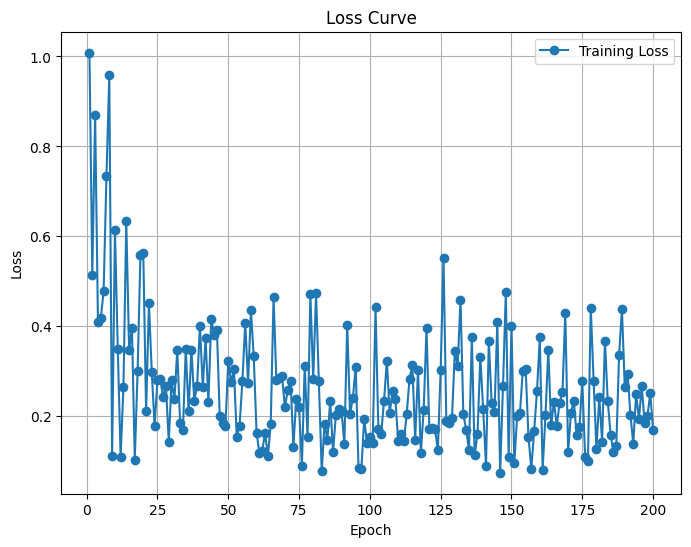

Predicted value for the first sample: 1.0889
Training Loss Scaling Unreversed: 0.3206130266189575
Training Loss Scaling Reversed: 2318.21630859375


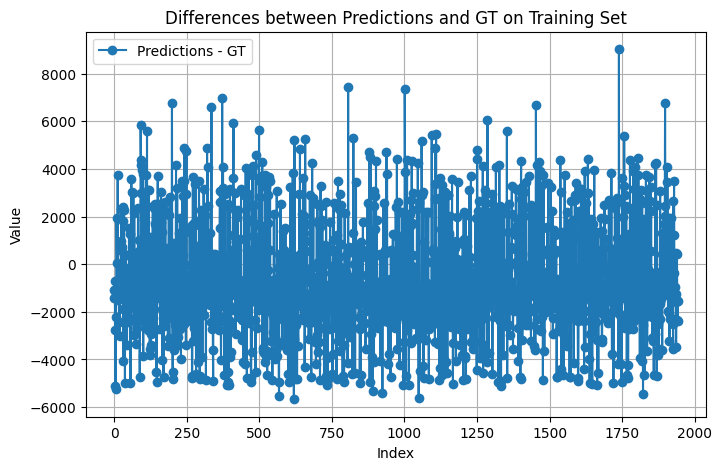

Predicted value for the first sample: 2.6925
Validation Loss Scaling Unreversed: 0.37709707021713257
Validation Loss Scaling Reversed: 2726.628173828125


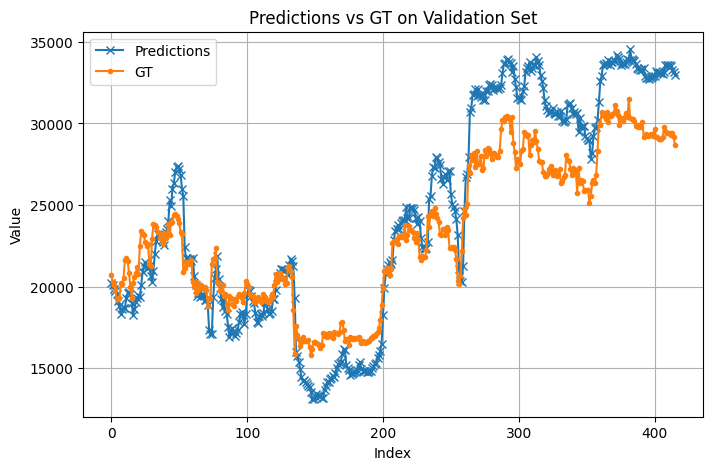

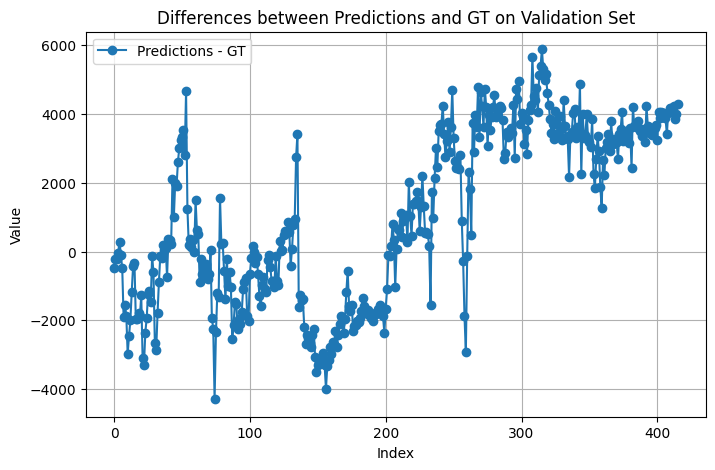

Return: 0.3491262197494507
Max Drawdown: -0.2249853014945984


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4462
Epoch [10/200], Loss: 0.2030
Epoch [15/200], Loss: 0.3854
Epoch [20/200], Loss: 0.4496
Epoch [25/200], Loss: 0.5203
Epoch [30/200], Loss: 0.3039
Epoch [35/200], Loss: 0.5440
Epoch [40/200], Loss: 0.2905
Epoch [45/200], Loss: 0.1778
Epoch [50/200], Loss: 0.2766
Epoch [55/200], Loss: 0.3642
Epoch [60/200], Loss: 0.1471
Epoch [65/200], Loss: 0.1557
Epoch [70/200], Loss: 0.2942
Epoch [75/200], Loss: 0.3022
Epoch [80/200], Loss: 0.1794
Epoch [85/200], Loss: 0.1564
Epoch [90/200], Loss: 0.2783
Epoch [95/200], Loss: 0.0955
Epoch [100/200], Loss: 0.1609
Epoch [105/200], Loss: 0.3170
Epoch [110/200], Loss: 0.1548
Epoch [115/200], Loss: 0.1666
Epoch [120/200], Loss: 0.1499
Epoch [125/200], Loss: 0.1857
Epoch [130/200], Loss: 0.1430
Epoch [135/200], Loss: 0.1332
Epoch [140/200], Loss: 0.2086
Epoch [145/200], Loss: 0.1548
Epoch [150/200], Loss: 0.4241
Epoch [155/200], Loss: 0.1647
Epoch [160/200], Loss: 0.2545
Epoch [165/200], Loss: 0.1873
Epoch [170/200], Loss: 0.0813


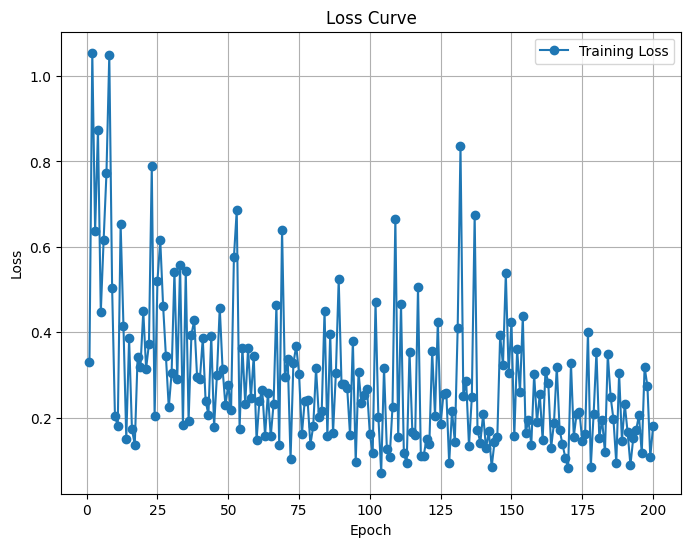

Predicted value for the first sample: 1.0852
Training Loss Scaling Unreversed: 0.34525060653686523
Training Loss Scaling Reversed: 2496.360107421875


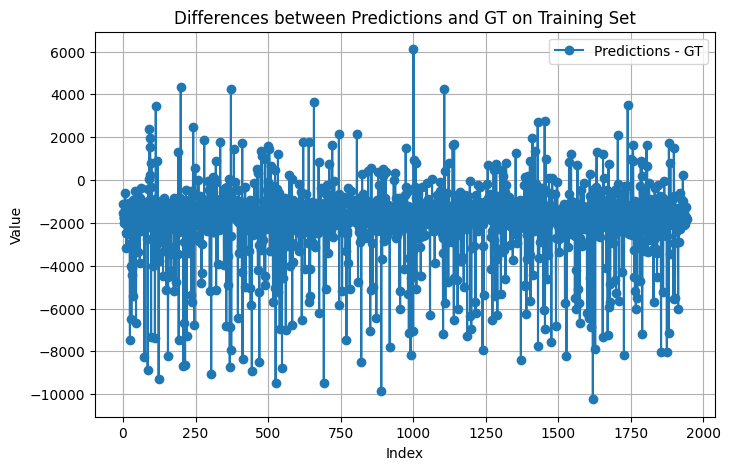

Predicted value for the first sample: 2.5049
Validation Loss Scaling Unreversed: 0.26019448041915894
Validation Loss Scaling Reversed: 1881.3553466796875


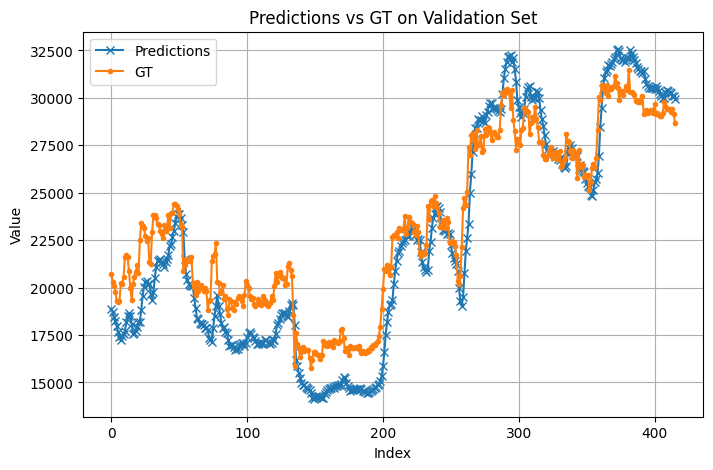

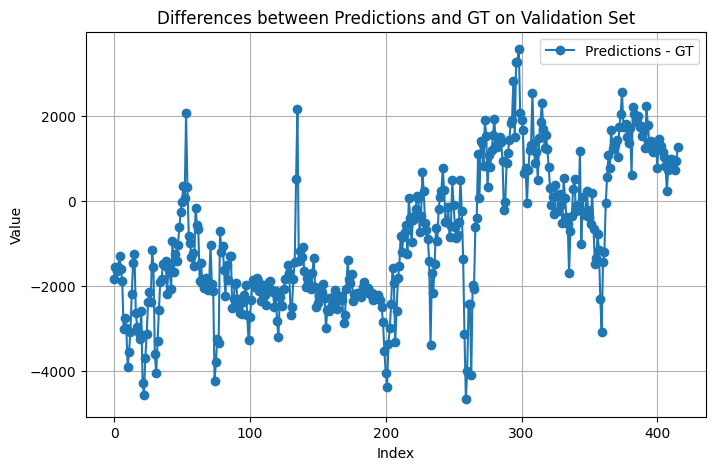

Return: 0.6002712249755859
Max Drawdown: -0.19951525330543518


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.5595
Epoch [10/200], Loss: 0.5672
Epoch [15/200], Loss: 1.1214
Epoch [20/200], Loss: 1.2105
Epoch [25/200], Loss: 0.3155
Epoch [30/200], Loss: 1.2644
Epoch [35/200], Loss: 0.2892
Epoch [40/200], Loss: 0.7097
Epoch [45/200], Loss: 0.3801
Epoch [50/200], Loss: 1.0454
Epoch [55/200], Loss: 0.6486
Epoch [60/200], Loss: 0.2047
Epoch [65/200], Loss: 1.2686
Epoch [70/200], Loss: 0.8479
Epoch [75/200], Loss: 0.2400
Epoch [80/200], Loss: 0.4373
Epoch [85/200], Loss: 0.3640
Epoch [90/200], Loss: 0.3958
Epoch [95/200], Loss: 0.3535
Epoch [100/200], Loss: 0.3073
Epoch [105/200], Loss: 0.5415
Epoch [110/200], Loss: 0.2465
Epoch [115/200], Loss: 0.2994
Epoch [120/200], Loss: 0.2724
Epoch [125/200], Loss: 0.4535
Epoch [130/200], Loss: 0.4959
Epoch [135/200], Loss: 0.4378
Epoch [140/200], Loss: 0.4710
Epoch [145/200], Loss: 0.3165
Epoch [150/200], Loss: 0.4044
Epoch [155/200], Loss: 0.2910
Epoch [160/200], Loss: 0.2685
Epoch [165/200], Loss: 0.5767
Epoch [170/200], Loss: 0.5719


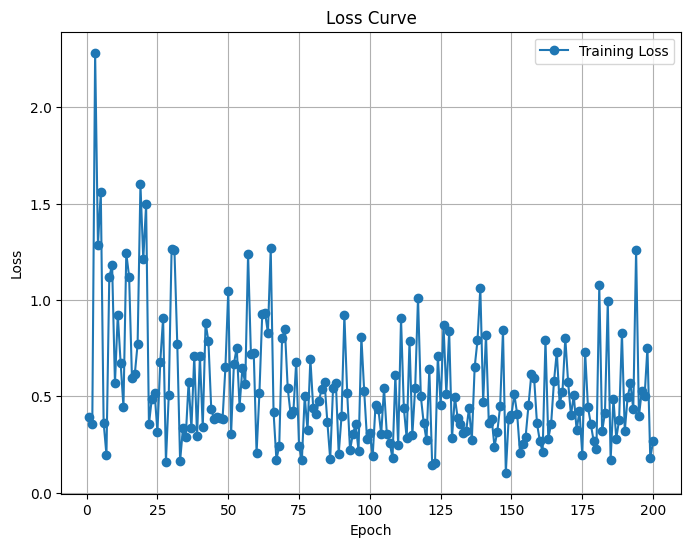

Predicted value for the first sample: 1.1941
Training Loss Scaling Unreversed: 0.2994806468486786
Training Loss Scaling Reversed: 2165.416748046875


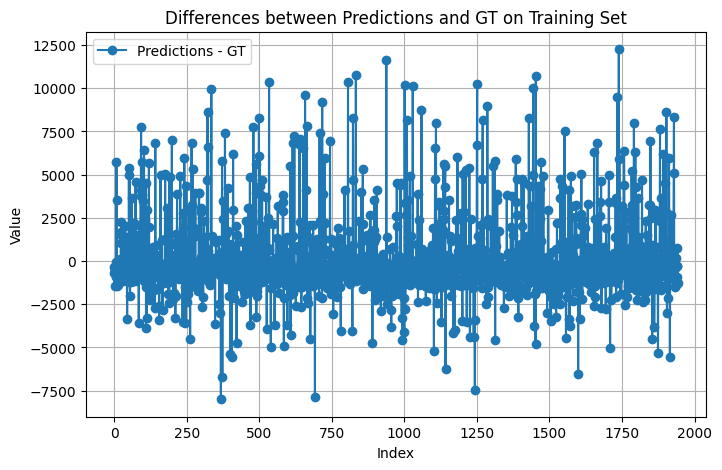

Predicted value for the first sample: 2.6725
Validation Loss Scaling Unreversed: 0.301049143075943
Validation Loss Scaling Reversed: 2176.758056640625


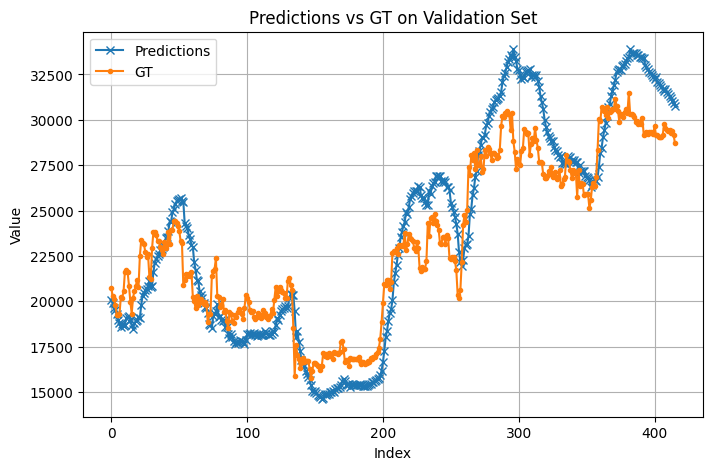

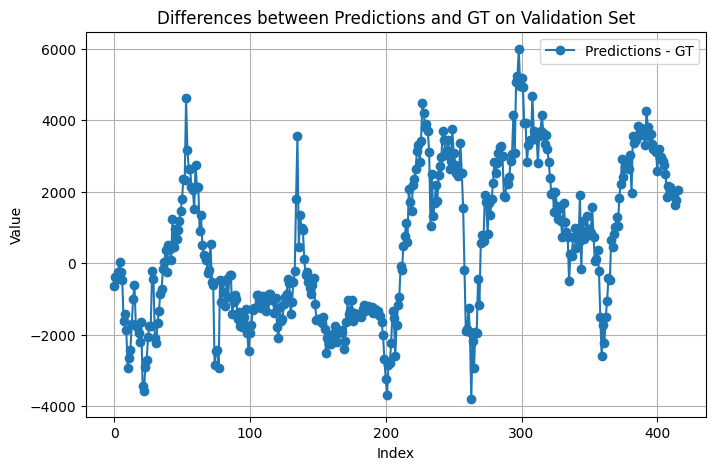

Return: 0.4887959957122803
Max Drawdown: -0.21800152957439423


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4036
Epoch [10/200], Loss: 0.2668
Epoch [15/200], Loss: 0.2392
Epoch [20/200], Loss: 0.2977
Epoch [25/200], Loss: 0.2105
Epoch [30/200], Loss: 0.1997
Epoch [35/200], Loss: 0.1759
Epoch [40/200], Loss: 0.2846
Epoch [45/200], Loss: 0.1763
Epoch [50/200], Loss: 0.1708
Epoch [55/200], Loss: 0.2717
Epoch [60/200], Loss: 0.2199
Epoch [65/200], Loss: 0.2581
Epoch [70/200], Loss: 0.2556
Epoch [75/200], Loss: 0.1664
Epoch [80/200], Loss: 0.0780
Epoch [85/200], Loss: 0.1462
Epoch [90/200], Loss: 0.1414
Epoch [95/200], Loss: 0.2244
Epoch [100/200], Loss: 0.1347
Epoch [105/200], Loss: 0.1115
Epoch [110/200], Loss: 0.2160
Epoch [115/200], Loss: 0.1722
Epoch [120/200], Loss: 0.4742
Epoch [125/200], Loss: 0.0962
Epoch [130/200], Loss: 0.1401
Epoch [135/200], Loss: 0.1194
Epoch [140/200], Loss: 0.2377
Epoch [145/200], Loss: 0.2437
Epoch [150/200], Loss: 0.1322
Epoch [155/200], Loss: 0.1384
Epoch [160/200], Loss: 0.1174
Epoch [165/200], Loss: 0.2748
Epoch [170/200], Loss: 0.1211


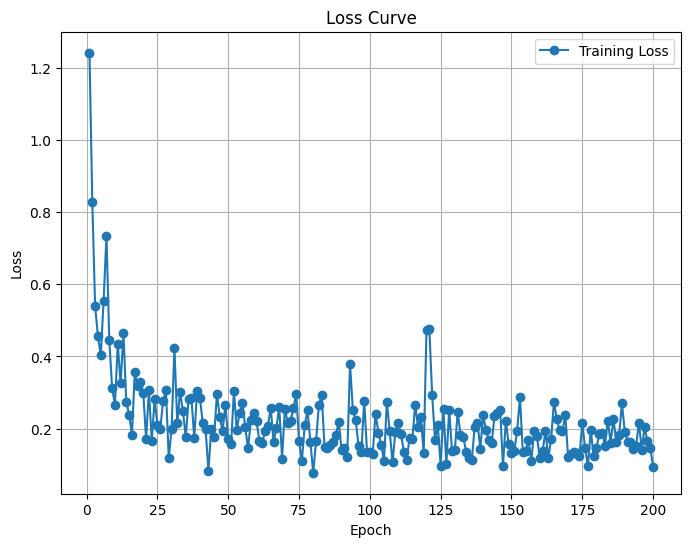

Predicted value for the first sample: 1.2809
Training Loss Scaling Unreversed: 0.22450070083141327
Training Loss Scaling Reversed: 1623.26904296875


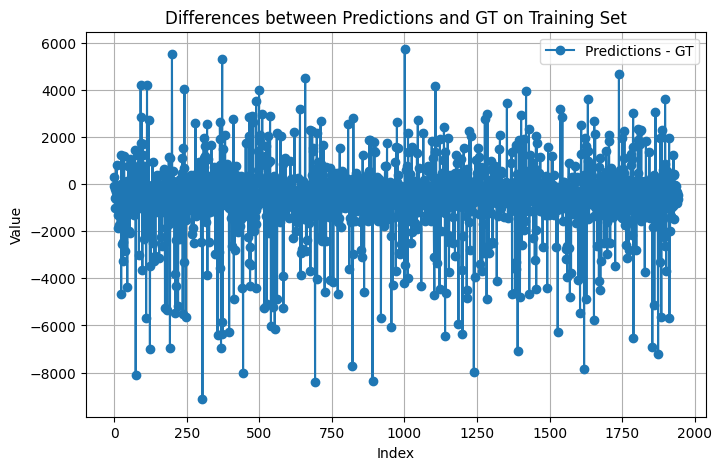

Predicted value for the first sample: 2.9331
Validation Loss Scaling Unreversed: 0.2776213586330414
Validation Loss Scaling Reversed: 2007.3616943359375


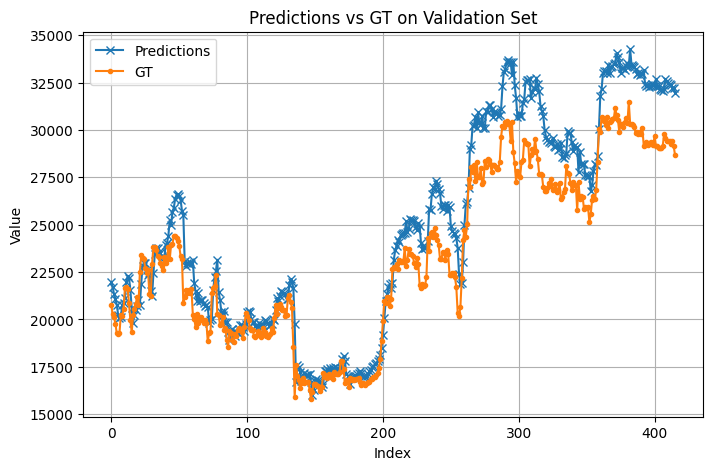

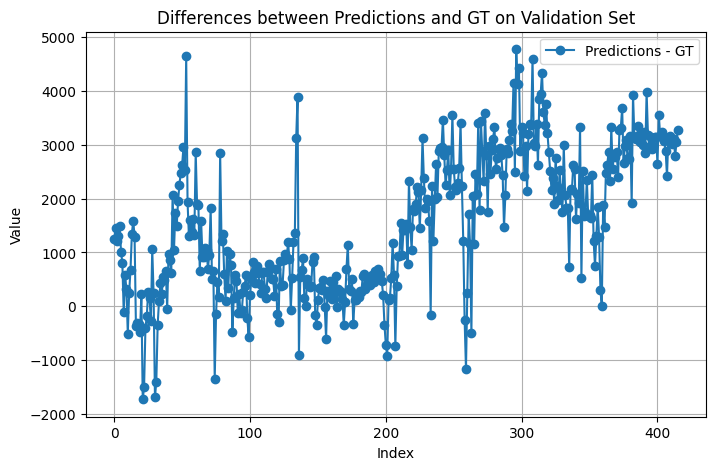

Return: 0.4381901025772095
Max Drawdown: -0.2328212559223175


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.6275
Epoch [10/200], Loss: 0.6763
Epoch [15/200], Loss: 0.4069
Epoch [20/200], Loss: 0.3992
Epoch [25/200], Loss: 0.2967
Epoch [30/200], Loss: 0.1970
Epoch [35/200], Loss: 0.3447
Epoch [40/200], Loss: 0.1443
Epoch [45/200], Loss: 0.3049
Epoch [50/200], Loss: 0.1205
Epoch [55/200], Loss: 0.3931
Epoch [60/200], Loss: 0.2951
Epoch [65/200], Loss: 0.2790
Epoch [70/200], Loss: 0.2136
Epoch [75/200], Loss: 0.2064
Epoch [80/200], Loss: 0.1577
Epoch [85/200], Loss: 0.2911
Epoch [90/200], Loss: 0.1187
Epoch [95/200], Loss: 0.3314
Epoch [100/200], Loss: 0.1650
Epoch [105/200], Loss: 0.2059
Epoch [110/200], Loss: 0.3182
Epoch [115/200], Loss: 0.2135
Epoch [120/200], Loss: 0.1422
Epoch [125/200], Loss: 0.2504
Epoch [130/200], Loss: 0.1780
Epoch [135/200], Loss: 0.1841
Epoch [140/200], Loss: 0.1731
Epoch [145/200], Loss: 0.3633
Epoch [150/200], Loss: 0.1510
Epoch [155/200], Loss: 0.1718
Epoch [160/200], Loss: 0.1857
Epoch [165/200], Loss: 0.2103
Epoch [170/200], Loss: 0.1322


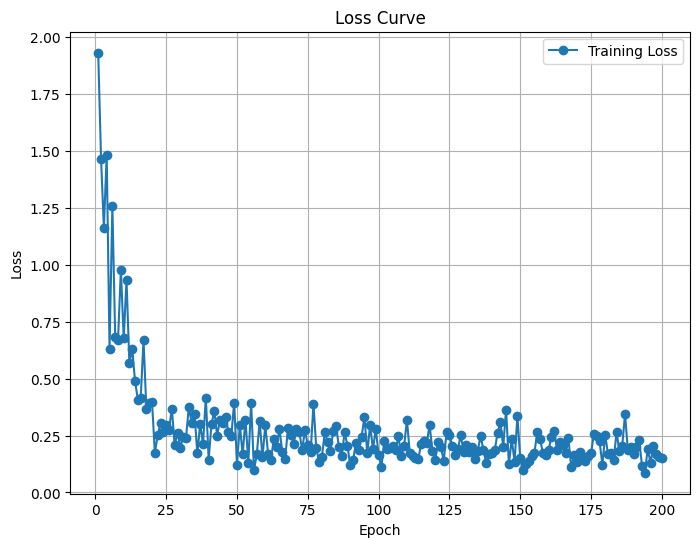

Predicted value for the first sample: 1.2334
Training Loss Scaling Unreversed: 0.15277832746505737
Training Loss Scaling Reversed: 1104.6749267578125


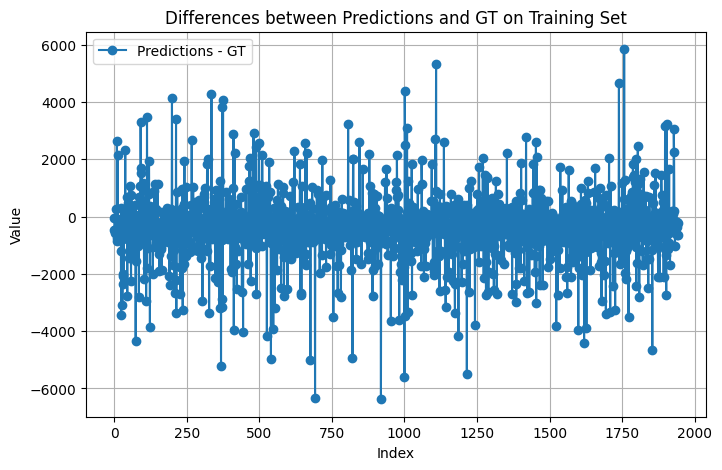

Predicted value for the first sample: 2.6971
Validation Loss Scaling Unreversed: 0.20098429918289185
Validation Loss Scaling Reversed: 1453.2318115234375


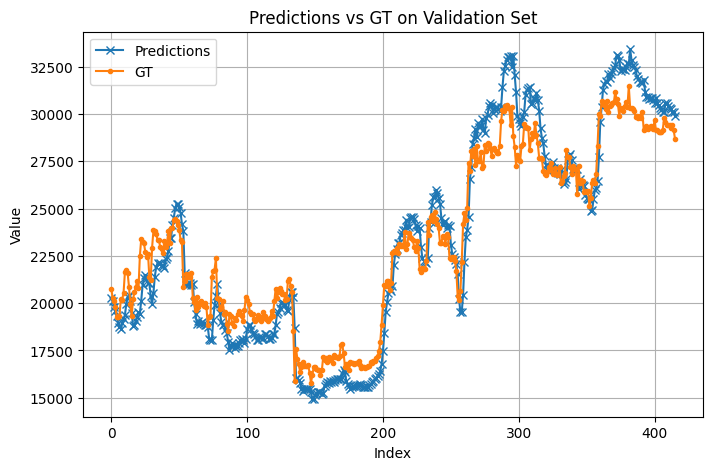

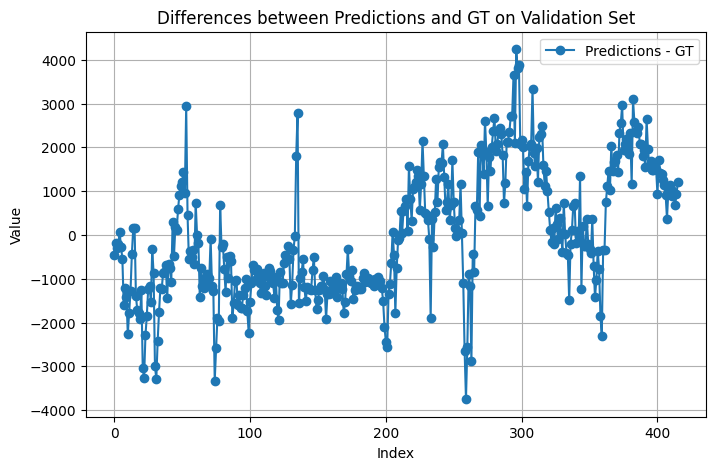

Return: 0.3999422788619995
Max Drawdown: -0.19520199298858643


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.2752
Epoch [10/200], Loss: 1.1626
Epoch [15/200], Loss: 1.2763
Epoch [20/200], Loss: 0.6973
Epoch [25/200], Loss: 0.9716
Epoch [30/200], Loss: 1.3273
Epoch [35/200], Loss: 0.4303
Epoch [40/200], Loss: 0.7899
Epoch [45/200], Loss: 1.0907
Epoch [50/200], Loss: 0.8962
Epoch [55/200], Loss: 0.6752
Epoch [60/200], Loss: 0.9334
Epoch [65/200], Loss: 0.5993
Epoch [70/200], Loss: 0.3407
Epoch [75/200], Loss: 0.4543
Epoch [80/200], Loss: 0.6477
Epoch [85/200], Loss: 1.0565
Epoch [90/200], Loss: 0.6616
Epoch [95/200], Loss: 0.4189
Epoch [100/200], Loss: 0.3235
Epoch [105/200], Loss: 0.1810
Epoch [110/200], Loss: 0.4959
Epoch [115/200], Loss: 0.2604
Epoch [120/200], Loss: 0.4036
Epoch [125/200], Loss: 0.4929
Epoch [130/200], Loss: 0.3642
Epoch [135/200], Loss: 0.6882
Epoch [140/200], Loss: 0.4274
Epoch [145/200], Loss: 0.4685
Epoch [150/200], Loss: 0.3179
Epoch [155/200], Loss: 0.3473
Epoch [160/200], Loss: 0.4960
Epoch [165/200], Loss: 0.3082
Epoch [170/200], Loss: 0.2558


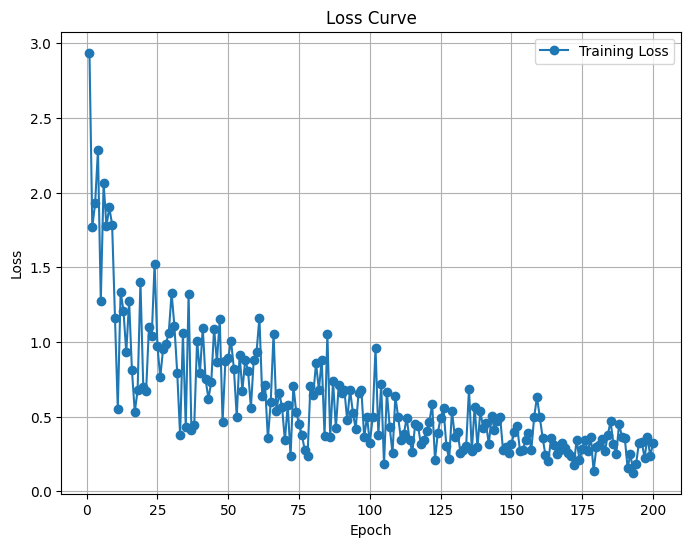

Predicted value for the first sample: 1.2126
Training Loss Scaling Unreversed: 0.25435033440589905
Training Loss Scaling Reversed: 1839.098876953125


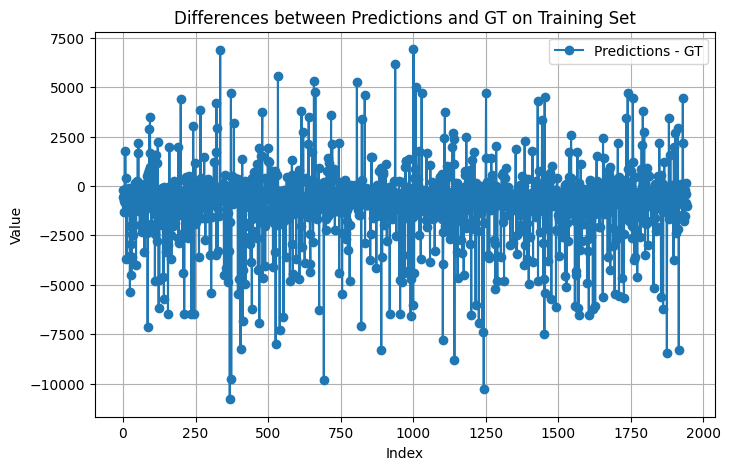

Predicted value for the first sample: 2.4622
Validation Loss Scaling Unreversed: 0.18859530985355377
Validation Loss Scaling Reversed: 1363.65234375


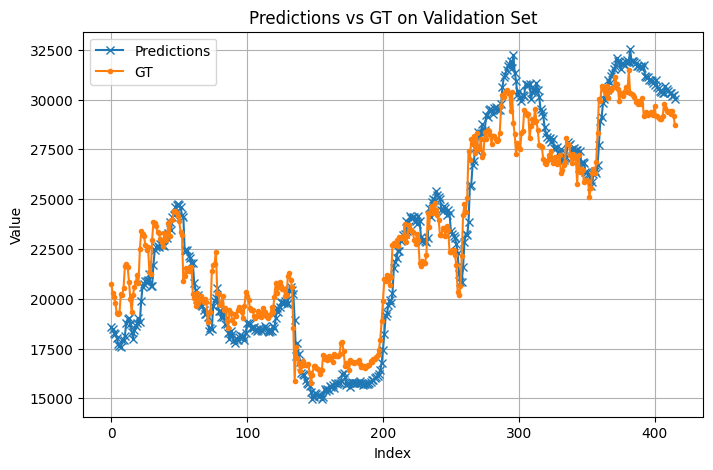

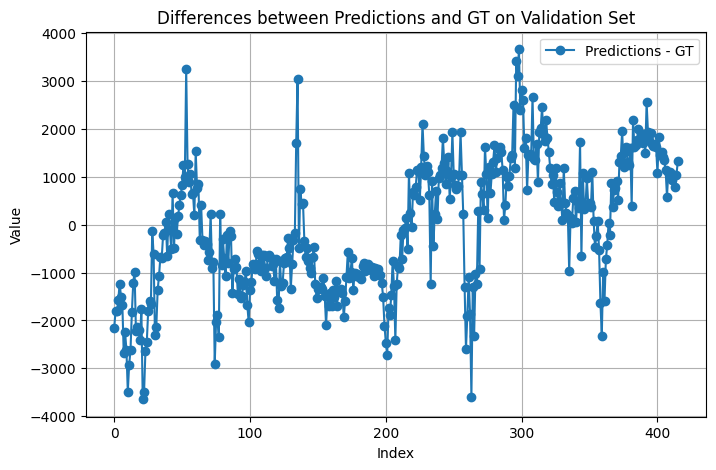

Return: 0.24403035640716553
Max Drawdown: -0.24638710916042328


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.3881
Epoch [10/200], Loss: 0.5788
Epoch [15/200], Loss: 0.4496
Epoch [20/200], Loss: 0.3436
Epoch [25/200], Loss: 0.2360
Epoch [30/200], Loss: 0.4046
Epoch [35/200], Loss: 0.2764
Epoch [40/200], Loss: 0.3367
Epoch [45/200], Loss: 0.3301
Epoch [50/200], Loss: 0.2597
Epoch [55/200], Loss: 0.2509
Epoch [60/200], Loss: 0.2656
Epoch [65/200], Loss: 0.3191
Epoch [70/200], Loss: 0.2509
Epoch [75/200], Loss: 0.3303
Epoch [80/200], Loss: 0.2086
Epoch [85/200], Loss: 0.2264
Epoch [90/200], Loss: 0.1407
Epoch [95/200], Loss: 0.2872
Epoch [100/200], Loss: 0.1778
Epoch [105/200], Loss: 0.2210
Epoch [110/200], Loss: 0.1433
Epoch [115/200], Loss: 0.1891
Epoch [120/200], Loss: 0.2962
Epoch [125/200], Loss: 0.1227
Epoch [130/200], Loss: 0.2047
Epoch [135/200], Loss: 0.2135
Epoch [140/200], Loss: 0.1476
Epoch [145/200], Loss: 0.1769
Epoch [150/200], Loss: 0.1904
Epoch [155/200], Loss: 0.3108
Epoch [160/200], Loss: 0.2330
Epoch [165/200], Loss: 0.1536
Epoch [170/200], Loss: 0.1689


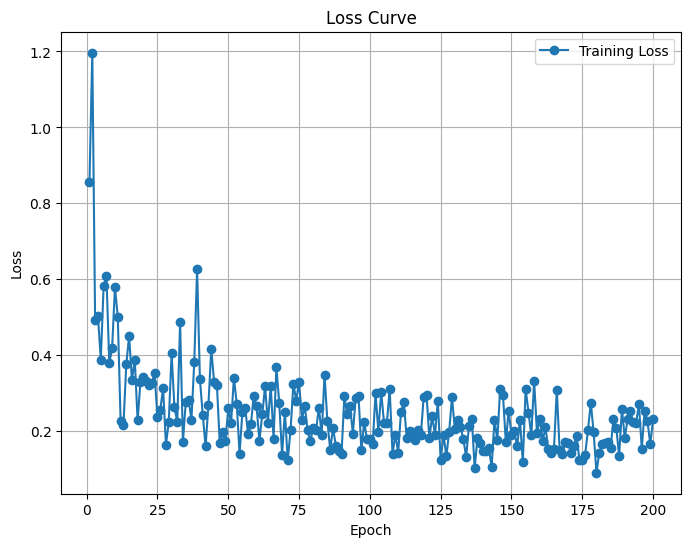

Predicted value for the first sample: 1.3482
Training Loss Scaling Unreversed: 0.18982093036174774
Training Loss Scaling Reversed: 1372.51416015625


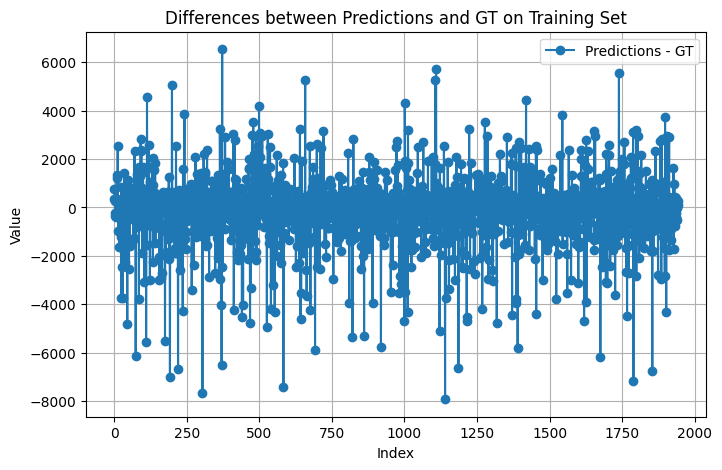

Predicted value for the first sample: 2.9747
Validation Loss Scaling Unreversed: 0.39970341324806213
Validation Loss Scaling Reversed: 2890.0849609375


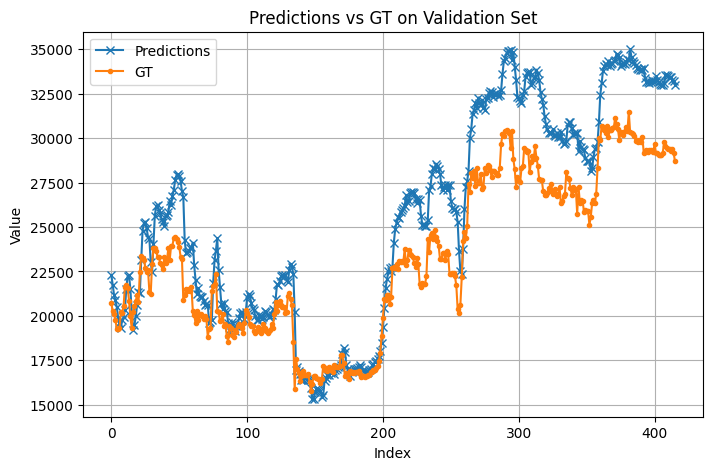

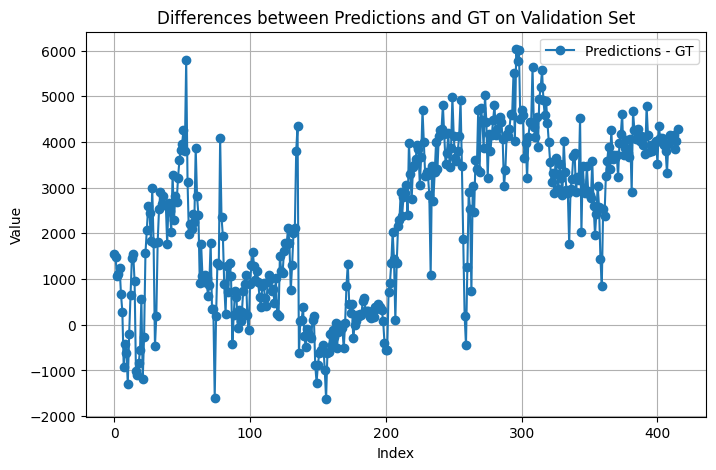

Return: 0.3949335813522339
Max Drawdown: -0.23404651880264282


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4034
Epoch [10/200], Loss: 0.3720
Epoch [15/200], Loss: 0.6883
Epoch [20/200], Loss: 0.3433
Epoch [25/200], Loss: 0.5248
Epoch [30/200], Loss: 0.4306
Epoch [35/200], Loss: 0.3269
Epoch [40/200], Loss: 0.2889
Epoch [45/200], Loss: 0.4590
Epoch [50/200], Loss: 0.2743
Epoch [55/200], Loss: 0.3916
Epoch [60/200], Loss: 0.2433
Epoch [65/200], Loss: 0.4318
Epoch [70/200], Loss: 0.5495
Epoch [75/200], Loss: 0.2995
Epoch [80/200], Loss: 0.3542
Epoch [85/200], Loss: 0.2597
Epoch [90/200], Loss: 0.4004
Epoch [95/200], Loss: 0.3005
Epoch [100/200], Loss: 0.2056
Epoch [105/200], Loss: 0.4188
Epoch [110/200], Loss: 0.2396
Epoch [115/200], Loss: 0.2514
Epoch [120/200], Loss: 0.2770
Epoch [125/200], Loss: 0.3278
Epoch [130/200], Loss: 0.3526
Epoch [135/200], Loss: 0.1922
Epoch [140/200], Loss: 0.3454
Epoch [145/200], Loss: 0.2061
Epoch [150/200], Loss: 0.4424
Epoch [155/200], Loss: 0.2051
Epoch [160/200], Loss: 0.1698
Epoch [165/200], Loss: 0.1409
Epoch [170/200], Loss: 0.3649


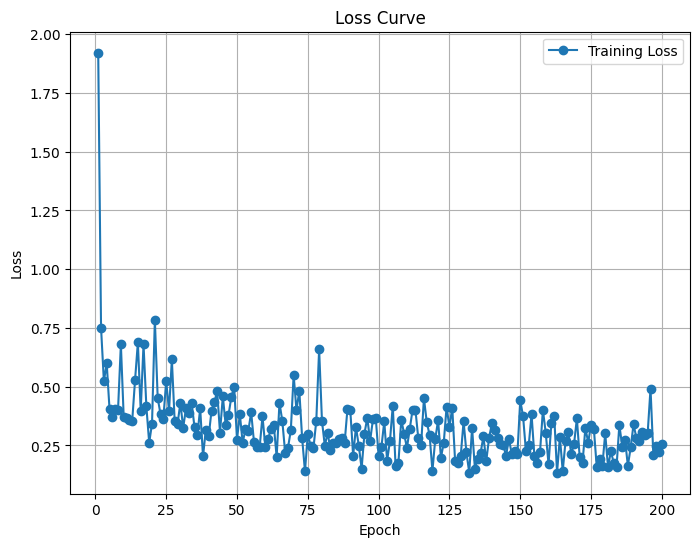

Predicted value for the first sample: 1.1832
Training Loss Scaling Unreversed: 0.43387532234191895
Training Loss Scaling Reversed: 3137.167724609375


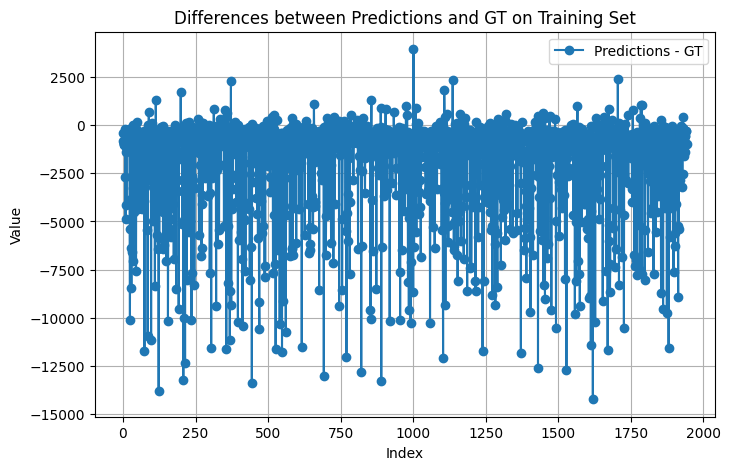

Predicted value for the first sample: 2.3984
Validation Loss Scaling Unreversed: 0.31590259075164795
Validation Loss Scaling Reversed: 2284.156982421875


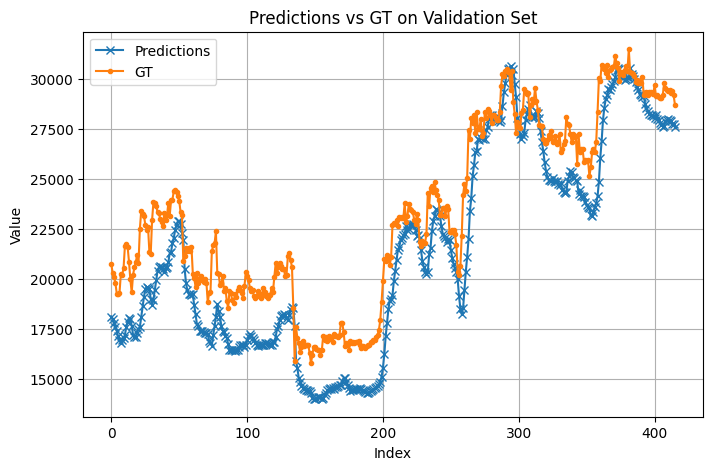

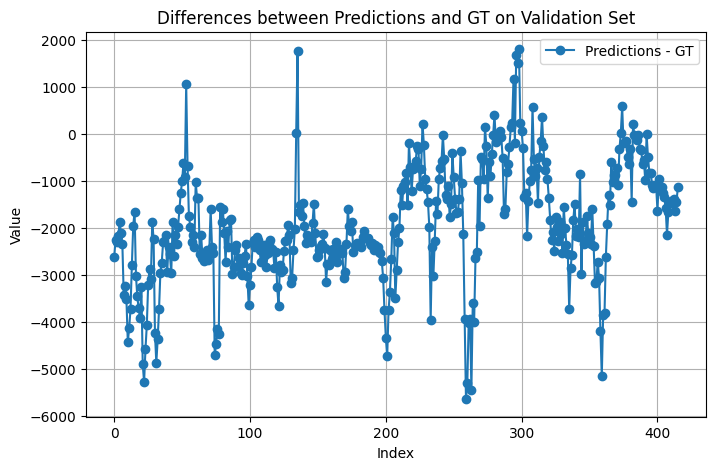

Return: 0.5961635112762451
Max Drawdown: -0.19493570923805237


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.8135
Epoch [10/200], Loss: 0.9806
Epoch [15/200], Loss: 1.1410
Epoch [20/200], Loss: 1.3057
Epoch [25/200], Loss: 0.7510
Epoch [30/200], Loss: 0.4898
Epoch [35/200], Loss: 1.0014
Epoch [40/200], Loss: 1.2634
Epoch [45/200], Loss: 0.8784
Epoch [50/200], Loss: 0.6332
Epoch [55/200], Loss: 0.5040
Epoch [60/200], Loss: 0.8543
Epoch [65/200], Loss: 0.3412
Epoch [70/200], Loss: 0.8495
Epoch [75/200], Loss: 0.9752
Epoch [80/200], Loss: 0.3359
Epoch [85/200], Loss: 0.7287
Epoch [90/200], Loss: 0.5563
Epoch [95/200], Loss: 0.5092
Epoch [100/200], Loss: 0.6666
Epoch [105/200], Loss: 0.4349
Epoch [110/200], Loss: 0.6246
Epoch [115/200], Loss: 0.3151
Epoch [120/200], Loss: 0.5224
Epoch [125/200], Loss: 0.5268
Epoch [130/200], Loss: 0.6139
Epoch [135/200], Loss: 0.3744
Epoch [140/200], Loss: 0.2514
Epoch [145/200], Loss: 0.4264
Epoch [150/200], Loss: 0.6129
Epoch [155/200], Loss: 0.6513
Epoch [160/200], Loss: 0.5555
Epoch [165/200], Loss: 0.1730
Epoch [170/200], Loss: 0.3325


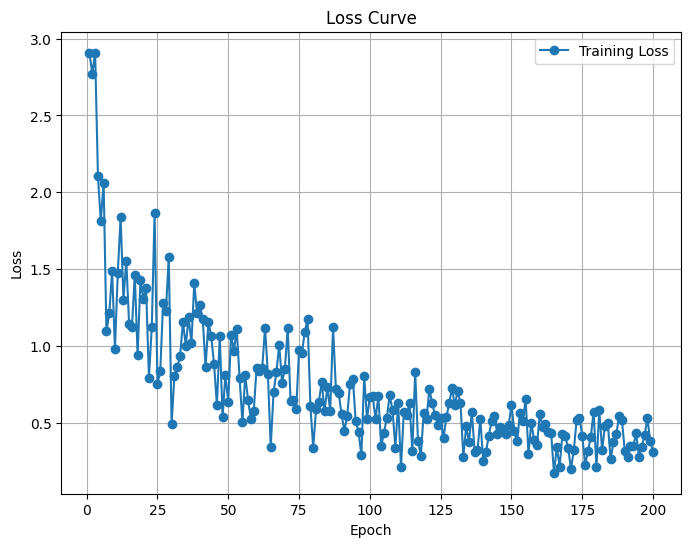

Predicted value for the first sample: 1.1916
Training Loss Scaling Unreversed: 0.31573233008384705
Training Loss Scaling Reversed: 2282.926025390625


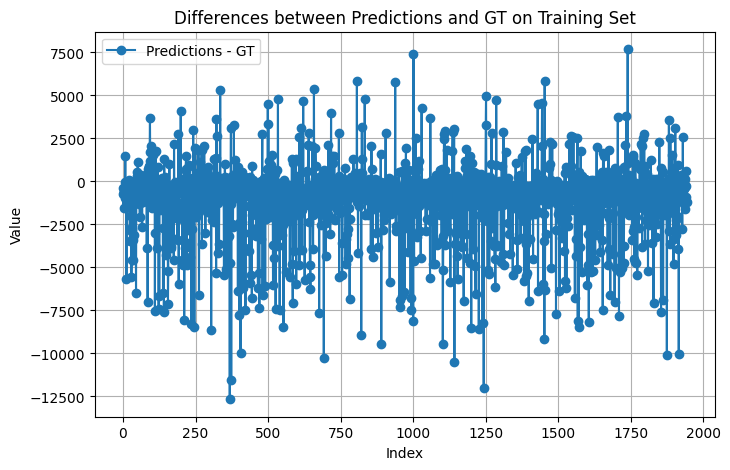

Predicted value for the first sample: 2.5509
Validation Loss Scaling Unreversed: 0.2359592616558075
Validation Loss Scaling Reversed: 1706.120849609375


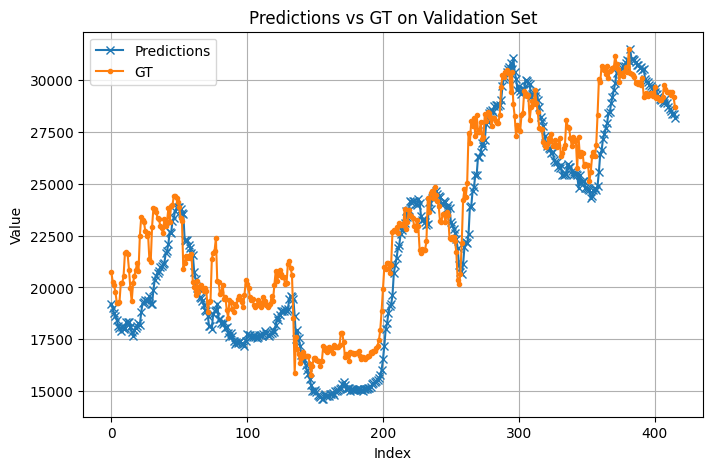

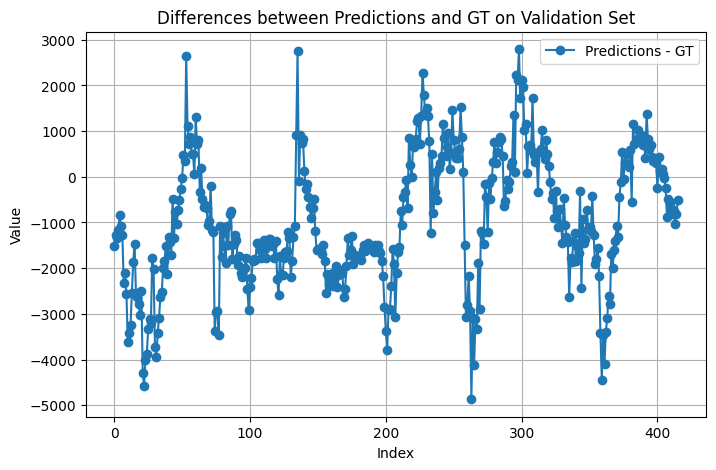

Return: 0.4018218517303467
Max Drawdown: -0.22245535254478455


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4588
Epoch [10/200], Loss: 0.4279
Epoch [15/200], Loss: 0.4434
Epoch [20/200], Loss: 0.3909
Epoch [25/200], Loss: 0.3030
Epoch [30/200], Loss: 0.5018
Epoch [35/200], Loss: 0.2437
Epoch [40/200], Loss: 0.3179
Epoch [45/200], Loss: 0.2462
Epoch [50/200], Loss: 0.3065
Epoch [55/200], Loss: 0.3828
Epoch [60/200], Loss: 0.2438
Epoch [65/200], Loss: 0.3035
Epoch [70/200], Loss: 0.2800
Epoch [75/200], Loss: 0.2868
Epoch [80/200], Loss: 0.2505
Epoch [85/200], Loss: 0.1930
Epoch [90/200], Loss: 0.1650
Epoch [95/200], Loss: 0.3274
Epoch [100/200], Loss: 0.2842
Epoch [105/200], Loss: 0.2762
Epoch [110/200], Loss: 0.3085
Epoch [115/200], Loss: 0.2062
Epoch [120/200], Loss: 0.2425
Epoch [125/200], Loss: 0.2215
Epoch [130/200], Loss: 0.2245
Epoch [135/200], Loss: 0.1290
Epoch [140/200], Loss: 0.3634
Epoch [145/200], Loss: 0.2594
Epoch [150/200], Loss: 0.2121
Epoch [155/200], Loss: 0.2322
Epoch [160/200], Loss: 0.1752
Epoch [165/200], Loss: 0.2005
Epoch [170/200], Loss: 0.1121


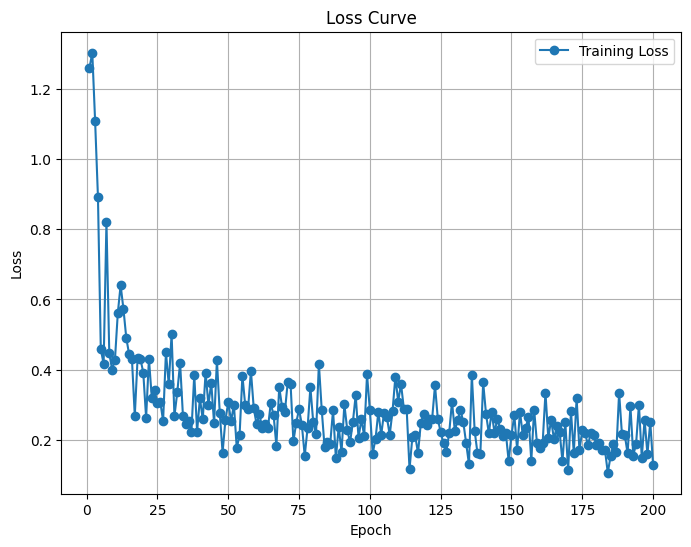

Predicted value for the first sample: 1.2900
Training Loss Scaling Unreversed: 0.2718563377857208
Training Loss Scaling Reversed: 1965.677490234375


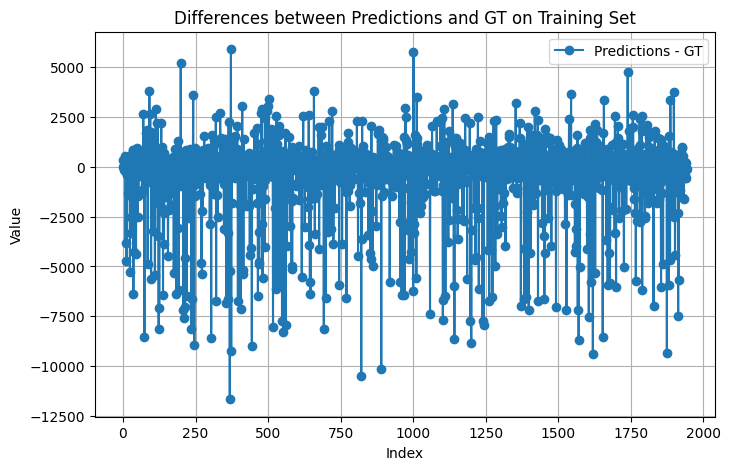

Predicted value for the first sample: 2.9627
Validation Loss Scaling Unreversed: 0.2984845042228699
Validation Loss Scaling Reversed: 2158.214111328125


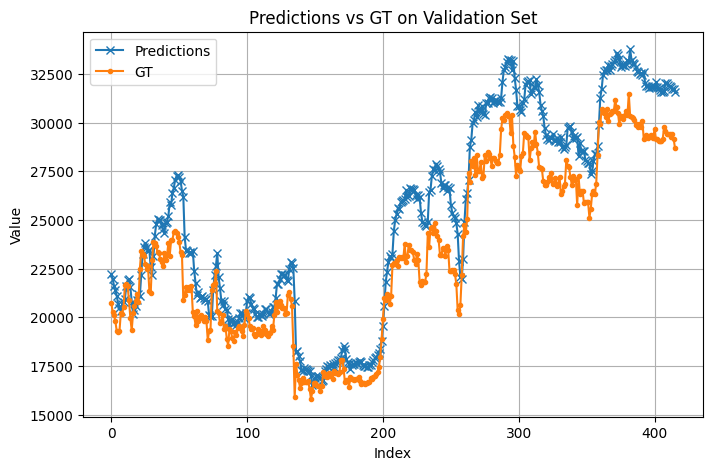

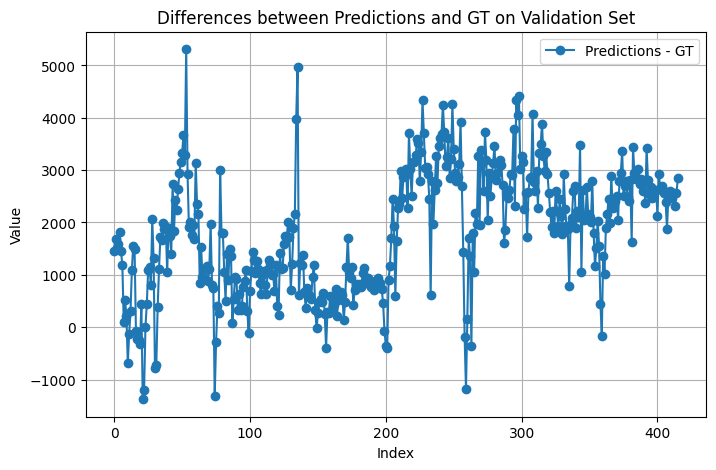

Return: 0.21226096153259277
Max Drawdown: -0.2607269883155823


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.6228
Epoch [10/200], Loss: 0.6166
Epoch [15/200], Loss: 0.7729
Epoch [20/200], Loss: 0.5614
Epoch [25/200], Loss: 0.3161
Epoch [30/200], Loss: 0.2378
Epoch [35/200], Loss: 0.4756
Epoch [40/200], Loss: 0.5989
Epoch [45/200], Loss: 0.3079
Epoch [50/200], Loss: 0.3799
Epoch [55/200], Loss: 0.4201
Epoch [60/200], Loss: 0.1804
Epoch [65/200], Loss: 0.3631
Epoch [70/200], Loss: 0.3085
Epoch [75/200], Loss: 0.3464
Epoch [80/200], Loss: 0.3956
Epoch [85/200], Loss: 0.4865
Epoch [90/200], Loss: 0.2740
Epoch [95/200], Loss: 0.2657
Epoch [100/200], Loss: 0.5459
Epoch [105/200], Loss: 0.2300
Epoch [110/200], Loss: 0.3788
Epoch [115/200], Loss: 0.1626
Epoch [120/200], Loss: 0.2358
Epoch [125/200], Loss: 0.1321
Epoch [130/200], Loss: 0.3175
Epoch [135/200], Loss: 0.3188
Epoch [140/200], Loss: 0.2432
Epoch [145/200], Loss: 0.3009
Epoch [150/200], Loss: 0.3037
Epoch [155/200], Loss: 0.1363
Epoch [160/200], Loss: 0.4577
Epoch [165/200], Loss: 0.2691
Epoch [170/200], Loss: 0.3558


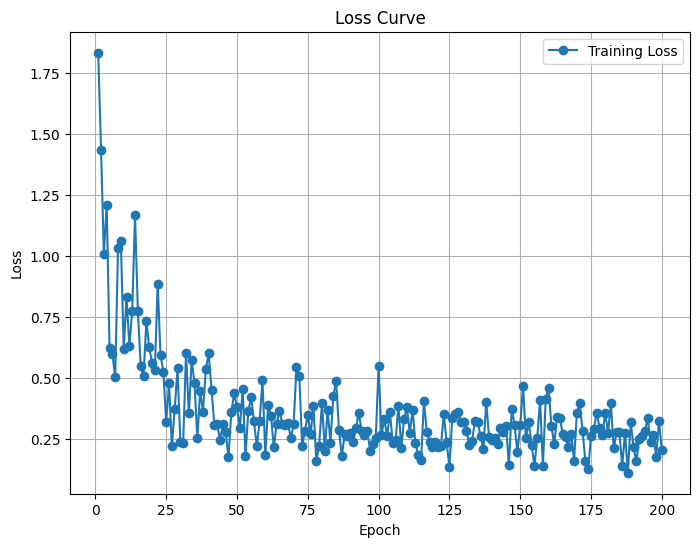

Predicted value for the first sample: 1.1235
Training Loss Scaling Unreversed: 0.5076899528503418
Training Loss Scaling Reversed: 3670.889892578125


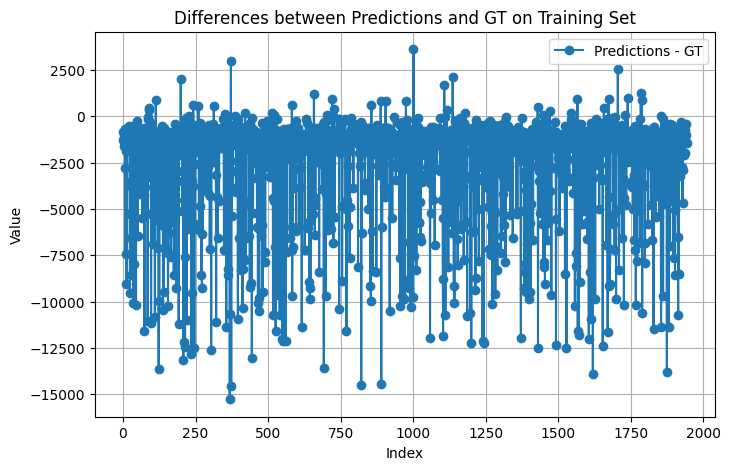

Predicted value for the first sample: 2.3460
Validation Loss Scaling Unreversed: 0.3038584887981415
Validation Loss Scaling Reversed: 2197.0712890625


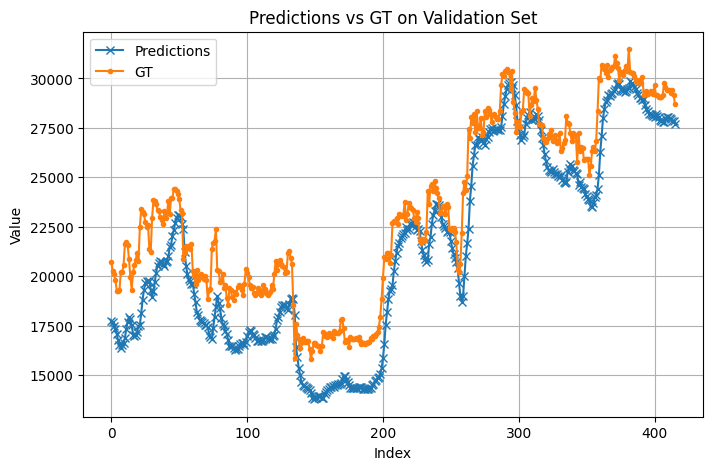

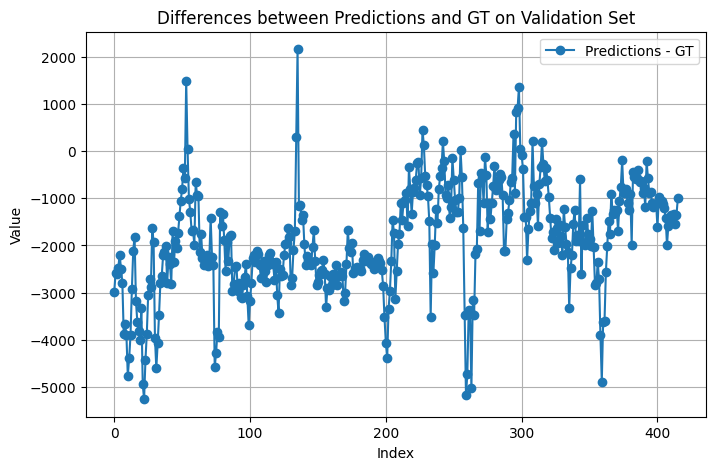

Return: 0.6534866094589233
Max Drawdown: -0.22801955044269562


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 2.4954
Epoch [10/200], Loss: 1.2873
Epoch [15/200], Loss: 1.8386
Epoch [20/200], Loss: 1.2459
Epoch [25/200], Loss: 1.1998
Epoch [30/200], Loss: 0.5781
Epoch [35/200], Loss: 1.1418
Epoch [40/200], Loss: 0.9831
Epoch [45/200], Loss: 0.8337
Epoch [50/200], Loss: 1.3909
Epoch [55/200], Loss: 0.8649
Epoch [60/200], Loss: 0.5538
Epoch [65/200], Loss: 0.4879
Epoch [70/200], Loss: 0.9044
Epoch [75/200], Loss: 0.6124
Epoch [80/200], Loss: 0.3837
Epoch [85/200], Loss: 0.3369
Epoch [90/200], Loss: 0.9166
Epoch [95/200], Loss: 0.4752
Epoch [100/200], Loss: 0.4490
Epoch [105/200], Loss: 0.4157
Epoch [110/200], Loss: 1.0159
Epoch [115/200], Loss: 0.6279
Epoch [120/200], Loss: 0.6350
Epoch [125/200], Loss: 0.6980
Epoch [130/200], Loss: 0.6625
Epoch [135/200], Loss: 0.6545
Epoch [140/200], Loss: 0.4815
Epoch [145/200], Loss: 0.2775
Epoch [150/200], Loss: 0.7980
Epoch [155/200], Loss: 0.4170
Epoch [160/200], Loss: 0.3013
Epoch [165/200], Loss: 0.3983
Epoch [170/200], Loss: 0.7611


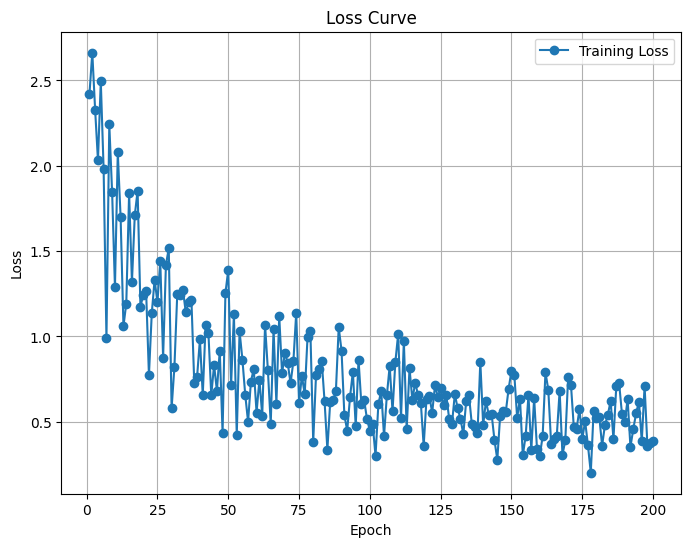

Predicted value for the first sample: 1.2152
Training Loss Scaling Unreversed: 0.3470623195171356
Training Loss Scaling Reversed: 2509.459716796875


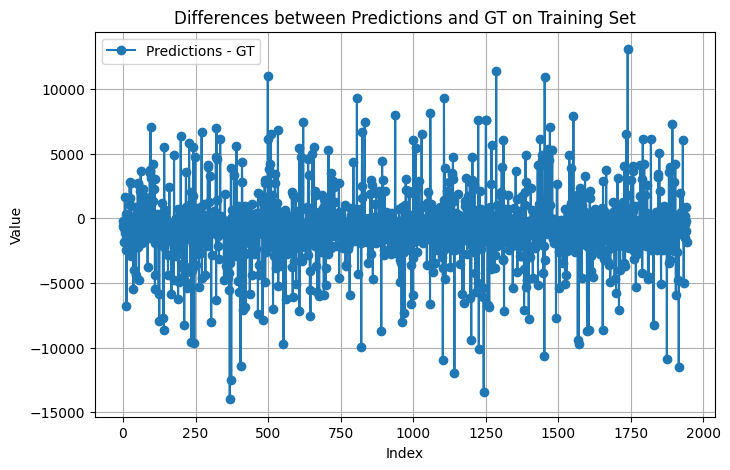

Predicted value for the first sample: 2.8160
Validation Loss Scaling Unreversed: 0.2065424621105194
Validation Loss Scaling Reversed: 1493.4205322265625


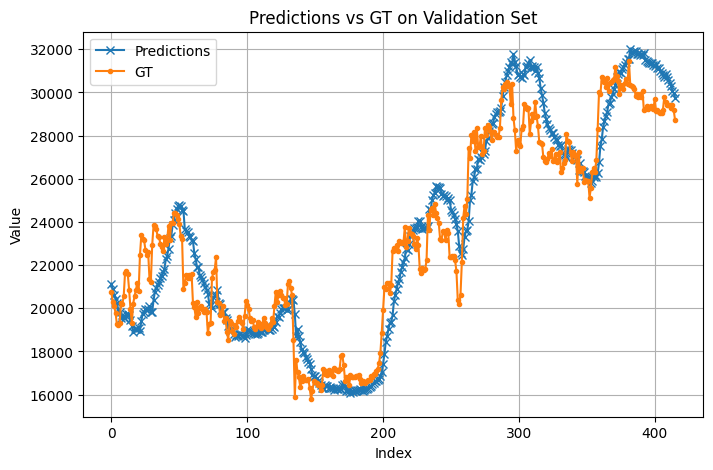

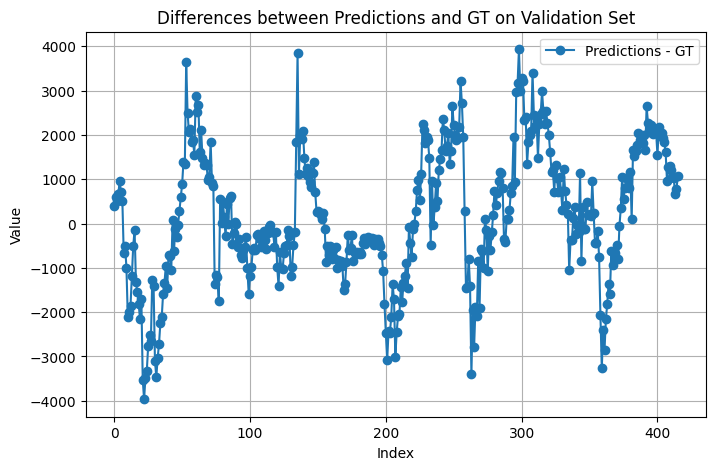

Return: 0.3758544921875
Max Drawdown: -0.23966063559055328


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.4134
Epoch [10/200], Loss: 0.1773
Epoch [15/200], Loss: 0.3237
Epoch [20/200], Loss: 0.2156
Epoch [25/200], Loss: 0.1999
Epoch [30/200], Loss: 0.2016
Epoch [35/200], Loss: 0.2848
Epoch [40/200], Loss: 0.2390
Epoch [45/200], Loss: 0.1220
Epoch [50/200], Loss: 0.1622
Epoch [55/200], Loss: 0.2350
Epoch [60/200], Loss: 0.1929
Epoch [65/200], Loss: 0.2201
Epoch [70/200], Loss: 0.1862
Epoch [75/200], Loss: 0.4037
Epoch [80/200], Loss: 0.1576
Epoch [85/200], Loss: 0.2464
Epoch [90/200], Loss: 0.1394
Epoch [95/200], Loss: 0.2638
Epoch [100/200], Loss: 0.1842
Epoch [105/200], Loss: 0.2276
Epoch [110/200], Loss: 0.1826
Epoch [115/200], Loss: 0.1729
Epoch [120/200], Loss: 0.1594
Epoch [125/200], Loss: 0.2646
Epoch [130/200], Loss: 0.3134
Epoch [135/200], Loss: 0.2326
Epoch [140/200], Loss: 0.2397
Epoch [145/200], Loss: 0.1895
Epoch [150/200], Loss: 0.2025
Epoch [155/200], Loss: 0.2266
Epoch [160/200], Loss: 0.1370
Epoch [165/200], Loss: 0.1816
Epoch [170/200], Loss: 0.1725


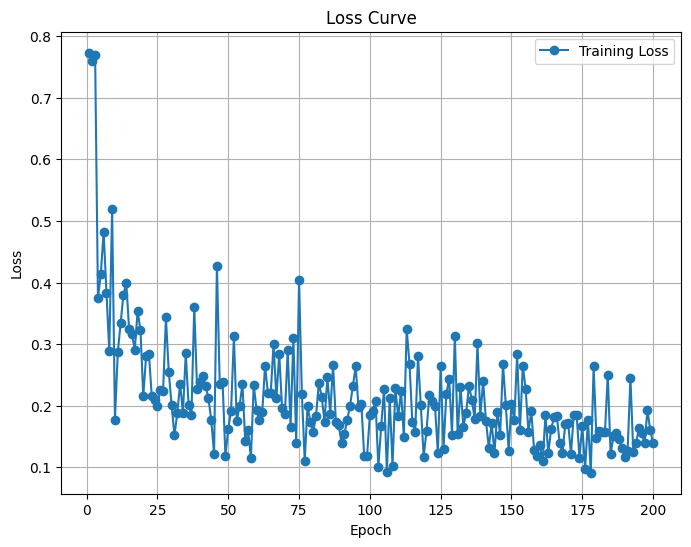

Predicted value for the first sample: 1.2923
Training Loss Scaling Unreversed: 0.14763161540031433
Training Loss Scaling Reversed: 1067.4613037109375


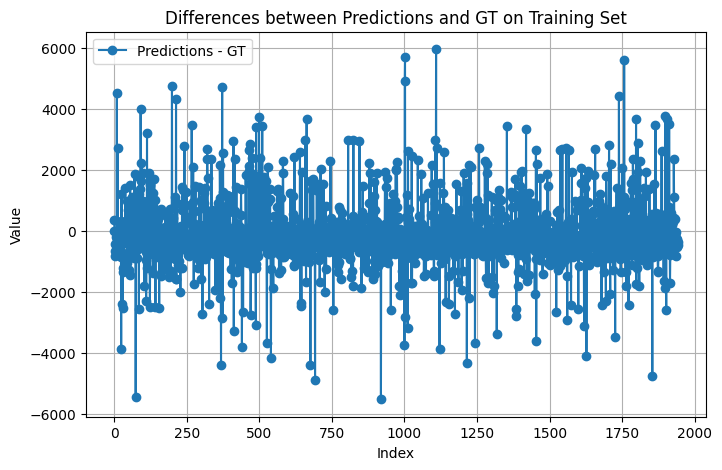

Predicted value for the first sample: 2.9033
Validation Loss Scaling Unreversed: 0.285160630941391
Validation Loss Scaling Reversed: 2061.875


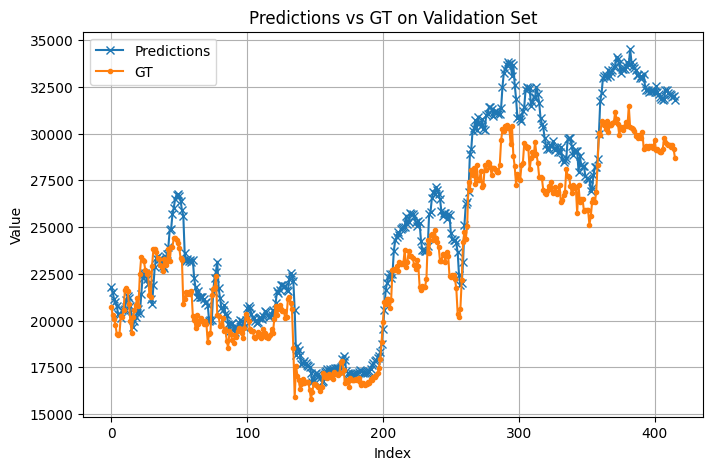

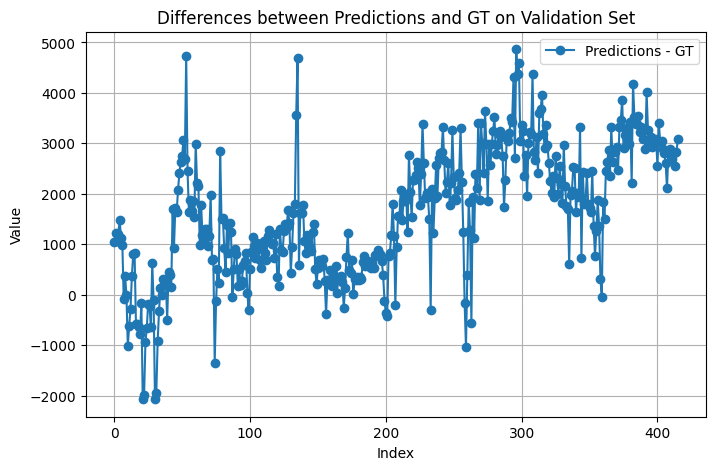

Return: 0.43290674686431885
Max Drawdown: -0.2484382838010788


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.2972
Epoch [10/200], Loss: 0.6690
Epoch [15/200], Loss: 0.3871
Epoch [20/200], Loss: 0.5075
Epoch [25/200], Loss: 0.4159
Epoch [30/200], Loss: 0.2909
Epoch [35/200], Loss: 0.3037
Epoch [40/200], Loss: 0.1827
Epoch [45/200], Loss: 0.3326
Epoch [50/200], Loss: 0.4564
Epoch [55/200], Loss: 0.3417
Epoch [60/200], Loss: 0.3135
Epoch [65/200], Loss: 0.3919
Epoch [70/200], Loss: 0.2441
Epoch [75/200], Loss: 0.1930
Epoch [80/200], Loss: 0.1912
Epoch [85/200], Loss: 0.1193
Epoch [90/200], Loss: 0.2086
Epoch [95/200], Loss: 0.2116
Epoch [100/200], Loss: 0.1924
Epoch [105/200], Loss: 0.1628
Epoch [110/200], Loss: 0.2103
Epoch [115/200], Loss: 0.2695
Epoch [120/200], Loss: 0.1591
Epoch [125/200], Loss: 0.2664
Epoch [130/200], Loss: 0.2352
Epoch [135/200], Loss: 0.2093
Epoch [140/200], Loss: 0.2114
Epoch [145/200], Loss: 0.1280
Epoch [150/200], Loss: 0.0949
Epoch [155/200], Loss: 0.2965
Epoch [160/200], Loss: 0.2061
Epoch [165/200], Loss: 0.1837
Epoch [170/200], Loss: 0.1194


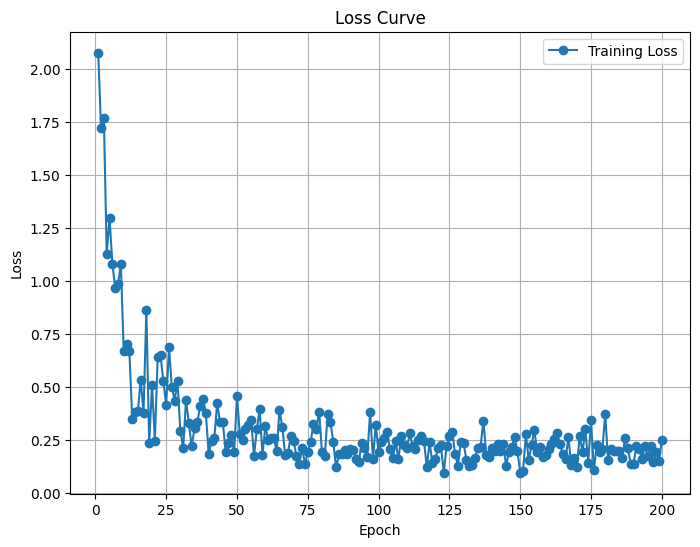

Predicted value for the first sample: 1.2569
Training Loss Scaling Unreversed: 0.18323606252670288
Training Loss Scaling Reversed: 1324.9019775390625


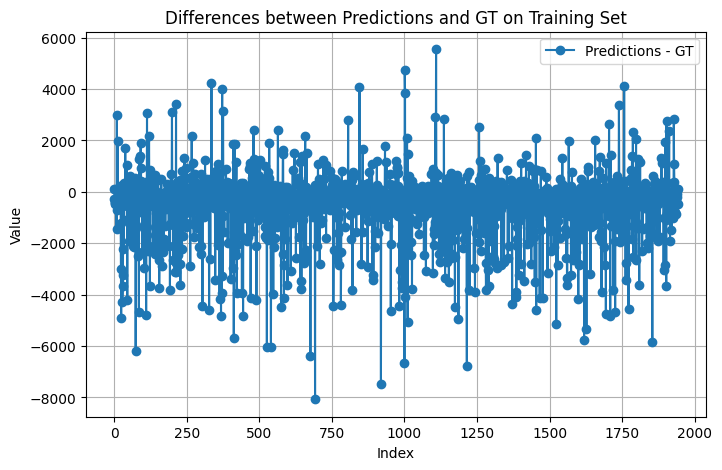

Predicted value for the first sample: 2.6795
Validation Loss Scaling Unreversed: 0.14790688455104828
Validation Loss Scaling Reversed: 1069.45166015625


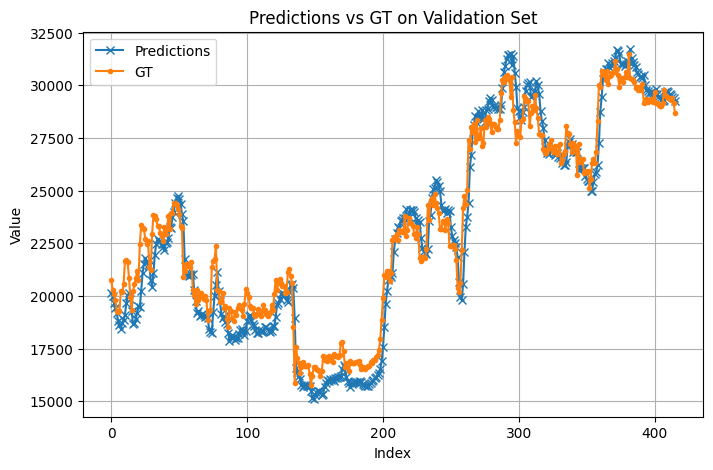

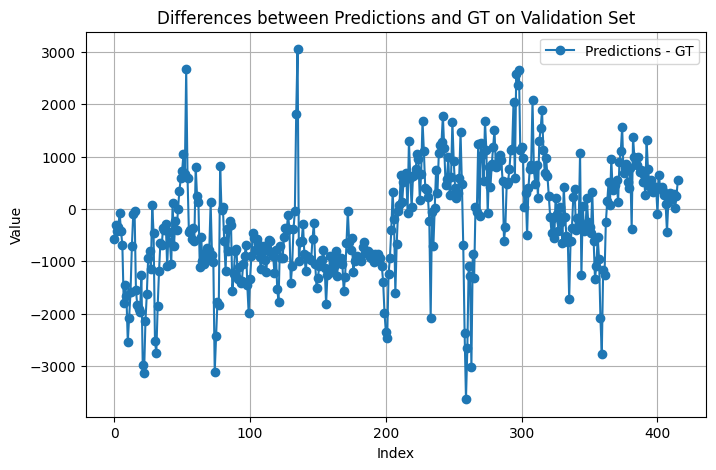

Return: 0.34263765811920166
Max Drawdown: -0.22629070281982422


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.7610
Epoch [10/200], Loss: 1.1980
Epoch [15/200], Loss: 1.3998
Epoch [20/200], Loss: 1.3644
Epoch [25/200], Loss: 0.6780
Epoch [30/200], Loss: 1.1914
Epoch [35/200], Loss: 0.3683
Epoch [40/200], Loss: 0.6599
Epoch [45/200], Loss: 0.8965
Epoch [50/200], Loss: 1.0305
Epoch [55/200], Loss: 0.7331
Epoch [60/200], Loss: 0.5256
Epoch [65/200], Loss: 0.9169
Epoch [70/200], Loss: 0.4902
Epoch [75/200], Loss: 0.6040
Epoch [80/200], Loss: 0.8095
Epoch [85/200], Loss: 0.4104
Epoch [90/200], Loss: 0.5836
Epoch [95/200], Loss: 1.0246
Epoch [100/200], Loss: 0.8745
Epoch [105/200], Loss: 0.9255
Epoch [110/200], Loss: 1.0641
Epoch [115/200], Loss: 0.5451
Epoch [120/200], Loss: 0.7584
Epoch [125/200], Loss: 0.7398
Epoch [130/200], Loss: 0.8152
Epoch [135/200], Loss: 0.4158
Epoch [140/200], Loss: 0.7126
Epoch [145/200], Loss: 0.8546
Epoch [150/200], Loss: 0.8046
Epoch [155/200], Loss: 0.2056
Epoch [160/200], Loss: 0.6217
Epoch [165/200], Loss: 0.2734
Epoch [170/200], Loss: 0.2672


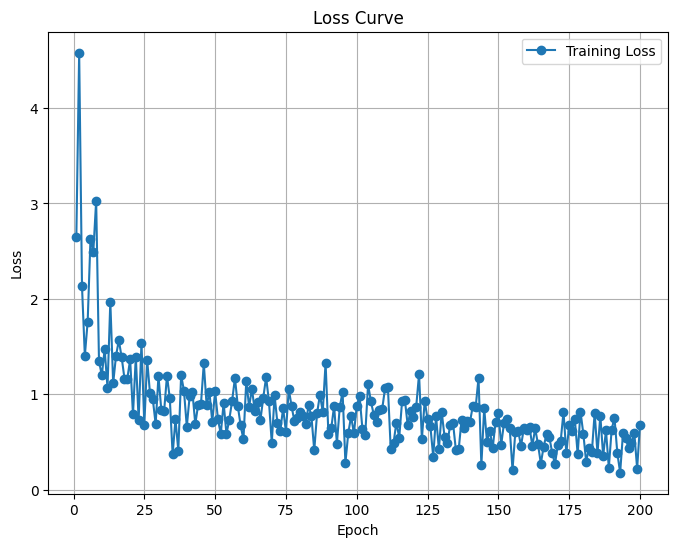

Predicted value for the first sample: 1.2684
Training Loss Scaling Unreversed: 0.44696030020713806
Training Loss Scaling Reversed: 3231.77978515625


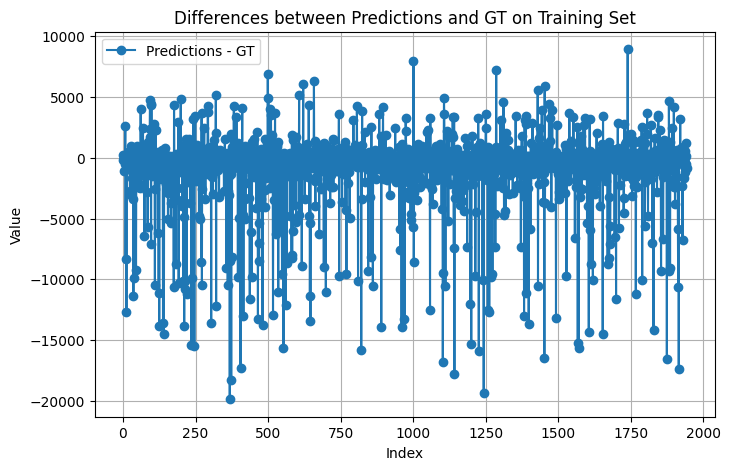

Predicted value for the first sample: 2.5424
Validation Loss Scaling Unreversed: 0.2549659013748169
Validation Loss Scaling Reversed: 1843.5496826171875


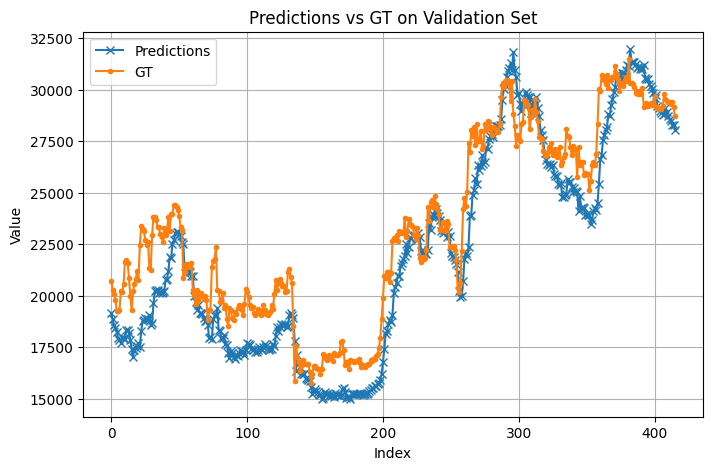

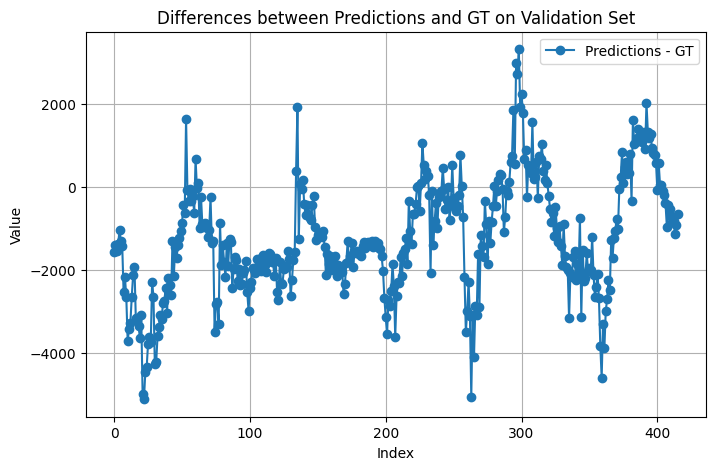

Return: 0.5137455463409424
Max Drawdown: -0.24458159506320953


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 0.8451
Epoch [10/200], Loss: 0.6213
Epoch [15/200], Loss: 0.5617
Epoch [20/200], Loss: 0.3530
Epoch [25/200], Loss: 0.2025
Epoch [30/200], Loss: 0.3042
Epoch [35/200], Loss: 0.4428
Epoch [40/200], Loss: 0.3591
Epoch [45/200], Loss: 0.1084
Epoch [50/200], Loss: 0.2037
Epoch [55/200], Loss: 0.2864
Epoch [60/200], Loss: 0.2455
Epoch [65/200], Loss: 0.2217
Epoch [70/200], Loss: 0.2588
Epoch [75/200], Loss: 0.2701
Epoch [80/200], Loss: 0.1675
Epoch [85/200], Loss: 0.1507
Epoch [90/200], Loss: 0.2489
Epoch [95/200], Loss: 0.1905
Epoch [100/200], Loss: 0.1937
Epoch [105/200], Loss: 0.2061
Epoch [110/200], Loss: 0.1869
Epoch [115/200], Loss: 0.2573
Epoch [120/200], Loss: 0.3492
Epoch [125/200], Loss: 0.1966
Epoch [130/200], Loss: 0.2527
Epoch [135/200], Loss: 0.2260
Epoch [140/200], Loss: 0.2683
Epoch [145/200], Loss: 0.1968
Epoch [150/200], Loss: 0.2323
Epoch [155/200], Loss: 0.1531
Epoch [160/200], Loss: 0.2236
Epoch [165/200], Loss: 0.1682
Epoch [170/200], Loss: 0.1265


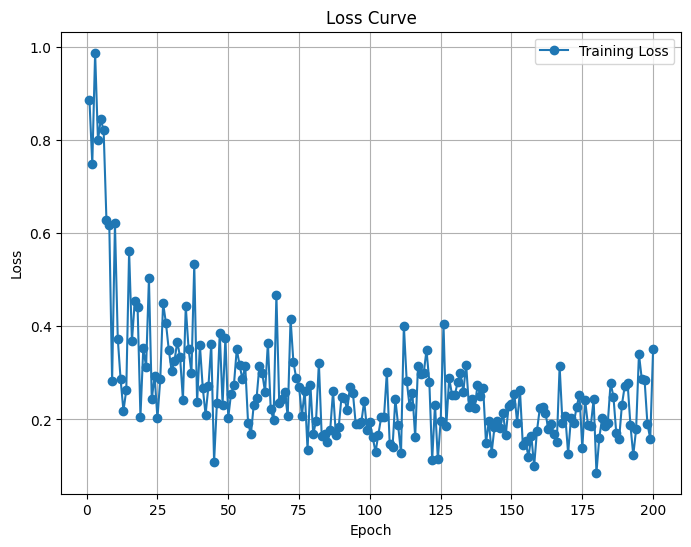

Predicted value for the first sample: 1.3486
Training Loss Scaling Unreversed: 0.23375314474105835
Training Loss Scaling Reversed: 1690.16943359375


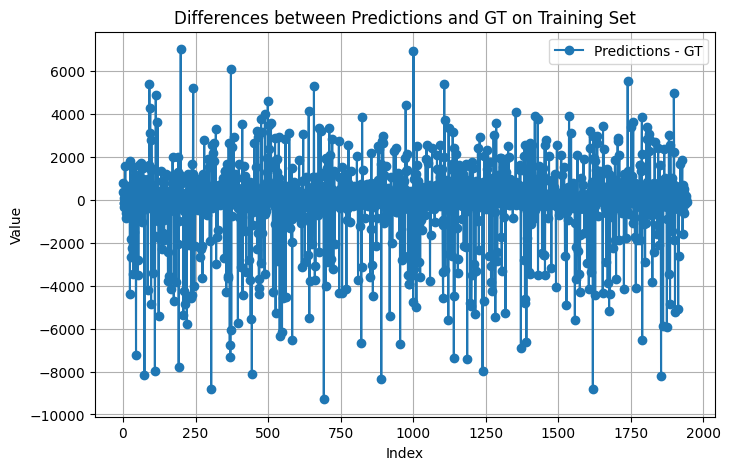

Predicted value for the first sample: 2.8343
Validation Loss Scaling Unreversed: 0.3156806230545044
Validation Loss Scaling Reversed: 2282.55224609375


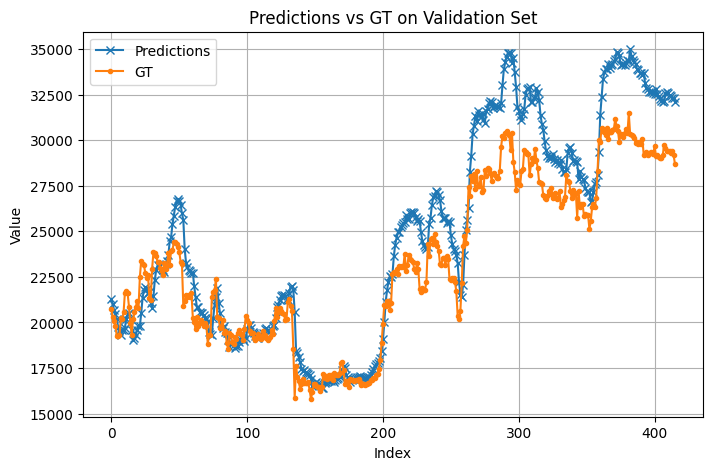

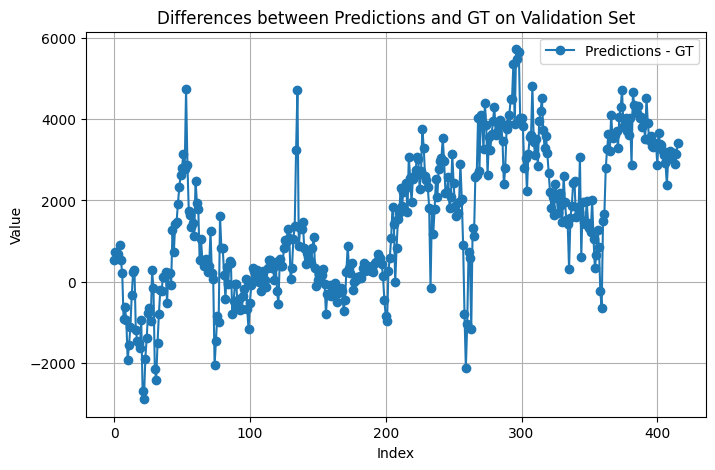

Return: 0.33501648902893066
Max Drawdown: -0.24815461039543152


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch [5/200], Loss: 1.1529
Epoch [10/200], Loss: 0.7821
Epoch [15/200], Loss: 0.7578
Epoch [20/200], Loss: 0.3114
Epoch [25/200], Loss: 0.3664
Epoch [30/200], Loss: 0.5486
Epoch [35/200], Loss: 0.4332
Epoch [40/200], Loss: 0.3059
Epoch [45/200], Loss: 0.2508
Epoch [50/200], Loss: 0.3611
Epoch [55/200], Loss: 0.4940
Epoch [60/200], Loss: 0.2421
Epoch [65/200], Loss: 0.3058
Epoch [70/200], Loss: 0.1892
Epoch [75/200], Loss: 0.2574
Epoch [80/200], Loss: 0.2616
Epoch [85/200], Loss: 0.3806
Epoch [90/200], Loss: 0.2341
Epoch [95/200], Loss: 0.3350
Epoch [100/200], Loss: 0.2491
Epoch [105/200], Loss: 0.2951
Epoch [110/200], Loss: 0.2983


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-12-12041ce20c49>", line 12, in <cell line: 3>
    v_loss, v_lossr, t_loss, t_lossr, ret, max_drawdown = train_model(batch_size, hidden_size, num_layers, dropout, learning_rate)
  File "<ipython-input-11-8702f450d2f8>", line 18, in train_model
    outputs = model(batch_x)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1736, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1747, in _call_impl
    return forward_call(*args, **kwargs)
  File "<ipython-input-9-071f582e0ab9>", line 32, in forward
    x = self.transformer_encoder(x)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1736, in _wrapped_call_impl
    re

TypeError: object of type 'NoneType' has no len()

In [ ]:
df = pd.read_excel("/content/drive/MyDrive/24fall_dlProject/Fine-Tuning-Transformer-Five-Features.xlsx", sheet_name=None)

for index, row in df["transformer_5features"].iterrows():
  if not pd.isna(row["Val_loss_unreversed"]):
    continue
  batch_size = int(row["Batch_size"])
  hidden_size = int(row["Hidden_size"])
  num_layers = int(row["Num_layers"])
  dropout = float(row["Dropout"])
  learning_rate = float(row["Learning_rate"])

  v_loss, v_lossr, t_loss, t_lossr, ret, max_drawdown = train_model(batch_size, hidden_size, num_layers, dropout, learning_rate)
  df["transformer_5features"].at[index, "Val_loss_unreversed"] = v_loss.item()
  df["transformer_5features"].at[index, "Val_loss_reversed"] = v_lossr.item()
  df["transformer_5features"].at[index, "Train_loss_unreversed"] = t_loss.item()
  df["transformer_5features"].at[index, "Train_loss_reversed"] = t_lossr.item()
  df["transformer_5features"].at[index, "Return"] = ret
  df["transformer_5features"].at[index, "Max_drawdown"] = max_drawdown
  df["transformer_5features"].to_excel("/content/drive/MyDrive/24fall_dlProject/Fine-Tuning-Transformer-Five-Features.xlsx", sheet_name="transformer_5features", index=False)